# LIQA Transcript Quantification Results Analysis

In this notebook, I cleaned, analyzed, and visualized the transcript quantification results obtained from LIQA. The long-read RNA-seq dataset I used is from Glinos et al. (2022) paper.

## Part 1: Import Data and Configure Python Libraries

In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec
%matplotlib inline
import seaborn as sns
import re
from IPython.display import display
from matplotlib.pyplot import gcf
from sklearn.decomposition import PCA 
from sklearn.preprocessing import StandardScaler
from PIL import ImageColor
from matplotlib.patches import Patch #for custom legend making
import scipy.spatial as sp, scipy.cluster.hierarchy as hc #for faster computing of hierarchial clusters

In [2]:
pd.options.display.max_columns = None #display all columns in dataframe
pd.options.display.max_rows = None

In [3]:
pd.options.display.max_colwidth = 100 #show the full content of long strings

### Import Data

In [4]:
data_dir = 'data_for_analysis'
liqa_quant_results_file_path = os.path.join(data_dir, 'liqa_quantification_output')
sample_info_path = os.path.join(data_dir, 'sample_info_complete.csv')
transcript_info_table_path = os.path.join(data_dir, 'glinos_novel_annotated_table.csv')
transcript_info_validated_path = os.path.join(data_dir, 'transcript_info_validated.csv')
novel_transcript_info_validated_path = os.path.join(data_dir,'novel_transcript_info_validated.csv')
annotated_transcript_info_validated_path = os.path.join(data_dir,'annotated_transcript_info_validated.csv')

#### Read data into pandas dataframe

In [5]:
sample_info = pd.read_csv(sample_info_path,sep=',')
transcript_info_table = pd.read_csv(transcript_info_table_path,sep='\t')
transcript_info_validated = pd.read_csv(transcript_info_validated_path,sep='\t')
novel_transcript_info_validated = pd.read_csv(novel_transcript_info_validated_path,sep='\t')
annotated_transcript_info_validated = pd.read_csv(annotated_transcript_info_validated_path,sep='\t')

## Part 2: Data Manipulation and Data Cleaning

### Merge Data (LIQA quantification output files)

Merge 92 separate files into one Pandas dataframe.

In [6]:
#change our working directory to the directory where we have all the data files
os.chdir(liqa_quant_results_file_path)

In [7]:
# Getting the FileNames of all txt files in the current dir.
filenames = [i for i in glob.glob(f"*.txt")] 

In [8]:
# base case to build the merged dataframe
liqa_merged_df = pd.read_csv(filenames[0],sep="\t")
liqa_merged_df['composite_id'] = liqa_merged_df.apply(lambda x:'%s_%s' % (x['IsoformName'],x['GeneName']),axis=1)

In [9]:
liqa_merged_df.head(3)

,GeneName,IsoformName,ReadPerGene_corrected,RelativeAbundance,infor_ratio,composite_id
0,ENSG00000204540.10,ENST00000479581.5,3.675106e-16,9.187765e-17,0.25,ENST00000479581.5_ENSG00000204540.10
1,ENSG00000204540.10,130750ff-7bd5-42fc-9951-2ee00e4c4253_ENSG00000204540.10,1.072175e-16,2.680438e-17,0.25,130750ff-7bd5-42fc-9951-2ee00e4c4253_ENSG00000204540.10_ENSG00000204540.10
2,ENSG00000204540.10,0d6ef114-5d3f-4df1-a18b-02c128c21368_ENSG00000204540.10,1.093079e-03,2.732699e-04,0.25,0d6ef114-5d3f-4df1-a18b-02c128c21368_ENSG00000204540.10_ENSG00000204540.10


In [10]:
liqa_merged_df.shape

(49189, 6)

Filter transcripts based on information ratio

In [11]:
info_ratio_threshold = 0

In [12]:
liqa_info_ratio_filter = liqa_merged_df.infor_ratio > info_ratio_threshold

In [13]:
liqa_merged_df = liqa_merged_df[liqa_info_ratio_filter]
liqa_merged_df.shape

(49189, 6)

In [14]:
liqa_merged_df.head()

,GeneName,IsoformName,ReadPerGene_corrected,RelativeAbundance,infor_ratio,composite_id
0,ENSG00000204540.10,ENST00000479581.5,3.675106e-16,9.187765e-17,0.25,ENST00000479581.5_ENSG00000204540.10
1,ENSG00000204540.10,130750ff-7bd5-42fc-9951-2ee00e4c4253_ENSG00000204540.10,1.072175e-16,2.680438e-17,0.25,130750ff-7bd5-42fc-9951-2ee00e4c4253_ENSG00000204540.10_ENSG00000204540.10
2,ENSG00000204540.10,0d6ef114-5d3f-4df1-a18b-02c128c21368_ENSG00000204540.10,1.093079e-03,2.732699e-04,0.25,0d6ef114-5d3f-4df1-a18b-02c128c21368_ENSG00000204540.10_ENSG00000204540.10
3,ENSG00000204540.10,e692f135-46a2-4cf8-953c-c0c636810214_ENSG00000204540.10,1.560275e-16,3.900688e-17,0.25,e692f135-46a2-4cf8-953c-c0c636810214_ENSG00000204540.10_ENSG00000204540.10
4,ENSG00000204540.10,73af7ae0-6dc4-4d06-8132-8e644cb837f4_ENSG00000204540.10,3.998907e+00,9.997267e-01,0.25,73af7ae0-6dc4-4d06-8132-8e644cb837f4_ENSG00000204540.10_ENSG00000204540.10


In [15]:
liqa_merged_df = liqa_merged_df[['composite_id','ReadPerGene_corrected']]
liqa_merged_df = liqa_merged_df.rename(columns={'ReadPerGene_corrected': filenames[0].split('.')[0]})

In [16]:
liqa_merged_df.head()

,composite_id,GTEX-1192X-0011-R10a-SM-4RXXZ
0,ENST00000479581.5_ENSG00000204540.10,3.675106e-16
1,130750ff-7bd5-42fc-9951-2ee00e4c4253_ENSG00000204540.10_ENSG00000204540.10,1.072175e-16
2,0d6ef114-5d3f-4df1-a18b-02c128c21368_ENSG00000204540.10_ENSG00000204540.10,1.093079e-03
3,e692f135-46a2-4cf8-953c-c0c636810214_ENSG00000204540.10_ENSG00000204540.10,1.560275e-16
4,73af7ae0-6dc4-4d06-8132-8e644cb837f4_ENSG00000204540.10_ENSG00000204540.10,3.998907e+00


In [17]:
# remove the first filename from the list
filenames_updated = filenames[1:] #remove the first file because it's already used to make the base dataframe

In [18]:
len(filenames_updated)

91

In [19]:
# loop through the list of filenames, create pandas dataframe, extract columns of interest and append to liqa_merged_df
for file in filenames_updated:
    # read text file into pandas dataframe
    quant_df = pd.read_csv(file,sep="\t")
    # create composite id
    quant_df['composite_id'] = quant_df.apply(lambda x:'%s_%s' % (x['IsoformName'],x['GeneName']),axis=1)
    # filter transcripts based on information ratio
    quant_info_ratio_filter = quant_df.infor_ratio > info_ratio_threshold
    quant_df = quant_df[quant_info_ratio_filter]
    # select columns
    quant_df = quant_df[['composite_id','ReadPerGene_corrected']]
    # rename column
    quant_df = quant_df.rename(columns={'ReadPerGene_corrected': file.split('.')[0]})
    # merge with liqa_merged_df
    liqa_merged_df = pd.merge(liqa_merged_df,quant_df,
                              left_on='composite_id',right_on='composite_id',how='outer')

In [20]:
liqa_merged_df.shape

(80371, 93)

In [21]:
liqa_merged_df.head()

,composite_id,GTEX-1192X-0011-R10a-SM-4RXXZ,GTEX-11H98-0011-R11b-SM-4SFLZ,GTEX-11TTK-0011-R7b-SM-4TVFS,GTEX-1211K-0826-SM-7LDFQ,GTEX-1313W-0011-R7b-SM-4ZL3U,GTEX-13QBU-0426-SM-5A4VT,GTEX-13QJ3-0726-SM-7LDHS,GTEX-13QJ3-0726-SM-7LDHS_rep,GTEX-13RTJ-0011-R7b-SM-5CTCB,GTEX-13VXU-0011-R11b-SM-5BFQZ,GTEX-13X6J-0011-R10b-SM-5CEKT,GTEX-145MH-0011-R3b-SM-5CTCM,GTEX-14BIL-0011-R10a-SM-5EQV4,GTEX-14BMU-0526-SM-5CA2F,GTEX-14BMU-0526-SM-5CA2F_rep,GTEX-14BMU-0526-SM-5CA2F_rep2,GTEX-14C5O-0011-R7b-SM-5GUPO,GTEX-14XAO-0926-SM-5YQWC,GTEX-15DCD-0011-R10b-SM-5S51M,GTEX-15ER7-0011-R5b-SM-5S51V,GTEX-15ER7-0011-R7a-SM-5QYP2,GTEX-15RIE-1726-SM-5V7WB,GTEX-17F97-0011-R11b-SM-63KY2,GTEX-17MFQ-1926-SM-6659L,GTEX-1C64N-0326-SM-6ZHT1,GTEX-1GN1W-0226-SM-7AGLJ,GTEX-1GN1W-0226-SM-7AGLJ_rep,GTEX-1H11D-1226-SM-9P6XJ,GTEX-1H3NZ-0011-R11b-SM-AUNOV,GTEX-1HBPH-0226-SM-7LLUW,GTEX-1I6K7-0626-SM-AAEQW,GTEX-1I6K7-1226-SM-AAEQX,GTEX-1IDJD-0226-SM-AML89,GTEX-1IDJD-1226-SM-AXRWG,GTEX-1IDJF-0826-SM-ABADH,GTEX-1IDJU-0726-SM-BXZK2,GTEX-1KXAM-0426-SM-CYKMP,GTEX-1KXAM-2426-SM-CYKMT,GTEX-1LVA9-0326-SM-CYRXA,GTEX-OHPL-0326-SM-DPSB8,GTEX-OIZI-0008-SM-2FR3P,GTEX-OXRL-0008-SM-2FR3T,GTEX-PSDG-0008-SM-3NZBI,GTEX-Q2AG-0011-R11A-SM-2EBL2,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep2,GTEX-QDT8-0011-R10A-SM-2FKJB,GTEX-QEG5-0008-SM-3QHW2_ctrl,GTEX-QEG5-0008-SM-3QHW2_exp,GTEX-QV44-0008-SM-3QNG7_ctrl1,GTEX-QV44-0008-SM-3QNG7_ctrl2,GTEX-QV44-0008-SM-3QNG7_exp,GTEX-R53T-0326-SM-2K8S4,GTEX-R55E-0008-SM-3QNG3,GTEX-R55E-0008-SM-3QNG3_direct,GTEX-RWS6-0008-SM-3QHWG,GTEX-RWS6-0008-SM-3QHWG_direct,GTEX-RWS6-0008-SM-3QHWG_rep,GTEX-S4P3-1326-SM-2QRBQ,GTEX-S4Z8-0008-SM-2Y983_ctrl,GTEX-S4Z8-0008-SM-2Y983_exp1,GTEX-S4Z8-0008-SM-2Y983_exp2,GTEX-S95S-0008-SM-3RQ8B_ctrl,GTEX-S95S-0008-SM-3RQ8B_exp1,GTEX-S95S-0008-SM-3RQ8B_exp2,GTEX-T5JC-0011-R10A-SM-2TT23,GTEX-T5JC-0011-R11A-SM-2TT24,GTEX-T5JC-0011-R7A-SM-2TT1Z,GTEX-UTHO-2426-SM-38ZXF,GTEX-WFG7-0008-SM-3ML7A,GTEX-WY7C-0008-SM-3NZB5_ctrl,GTEX-WY7C-0008-SM-3NZB5_exp,GTEX-WY7C-0726-SM-3GLGQ,GTEX-WY7C-1126-SM-3GS2X,GTEX-WY7C-1126-SM-3GS2X_rep,GTEX-WY7C-1126-SM-3GS2X_rep2,GTEX-WYJK-2426-SM-3H5V1,GTEX-WYVS-0526-SM-3H5V7,GTEX-Y5LM-0426-SM-3YX99,GTEX-Y5LM-0426-SM-3YX99_rep,GTEX-Y5LM-0426-SM-3YX99_rep2,GTEX-ZF29-2026-SM-4TVXH,GTEX-ZPU1-0826-SM-4UJSC,GTEX-ZT9X-0326-SM-4U9QG,GTEX-ZT9X-1826-SM-4V2KV,GTEX-ZT9X-1826-SM-4V2KV_rep,GTEX-ZT9X-1826-SM-4V2KV_rep2,GTEX-ZVZP-0226-SM-4VEIO,K562_ampure,K562_ampure_70ng,K562_extrawash,K562_extrawashwarm
0,ENST00000479581.5_ENSG00000204540.10,3.675106e-16,1.125000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.333335,0.000009,2.911719e-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,2.466322e-08,NaN,2.793081e-14,NaN,NaN,0.000525,NaN,NaN,NaN,NaN,NaN,NaN,3.333002,NaN,NaN,NaN,NaN,0.000000e+00,5.333333e+00,NaN,1.750001,NaN,0.000126,NaN,NaN,0.000000,NaN,NaN,NaN,3.428568,NaN,0.0,NaN,NaN,NaN,0.000000,NaN,9.634070e-11,NaN,NaN,NaN,NaN,NaN,NaN,3.560130e-10,1.837553e-15,NaN,0.000051,5.046990e-20,NaN,NaN,NaN,NaN,NaN,6.399547,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,130750ff-7bd5-42fc-9951-2ee00e4c4253_ENSG00000204540.10_ENSG00000204540.10,1.072175e-16,0.916406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.324625,6.117818,4.000190e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.407292,NaN,3.999044e+00,NaN,7.595608e+00,NaN,NaN,0.000153,NaN,NaN,NaN,NaN,NaN,NaN,0.000158,NaN,NaN,NaN,NaN,6.962141e-37,8.439969e-03,NaN,0.000001,NaN,0.000037,NaN,NaN,0.407292,NaN,NaN,NaN,0.465491,NaN,0.0,NaN,NaN,NaN,0.000429,NaN,5.430556e-01,NaN,NaN,NaN,NaN,NaN,NaN,2.209573e-04,5.360875e-16,NaN,0.000015,3.854930e+00,NaN,NaN,NaN,NaN,NaN,0.000142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0d6ef114-5d3f-4df1-a18b-02c128c21368_ENSG00000204540.10_ENSG00000204540.10,1.093079e-03,0.003797,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000004,4.061738,5.997749e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,9.200212e-09,NaN,3.258940e+00,NaN,NaN,0.000196,NaN,NaN,NaN,NaN,NaN,NaN,0.887575,NaN,NaN,NaN,NaN,6.474913e-03,5.320678e+00,NaN,0.000886,NaN,0.0

In [22]:
liqa_merged_df[liqa_merged_df.composite_id=='ENST00000368935.1_ENSG00000143363.15']

,composite_id,GTEX-1192X-0011-R10a-SM-4RXXZ,GTEX-11H98-0011-R11b-SM-4SFLZ,GTEX-11TTK-0011-R7b-SM-4TVFS,GTEX-1211K-0826-SM-7LDFQ,GTEX-1313W-0011-R7b-SM-4ZL3U,GTEX-13QBU-0426-SM-5A4VT,GTEX-13QJ3-0726-SM-7LDHS,GTEX-13QJ3-0726-SM-7LDHS_rep,GTEX-13RTJ-0011-R7b-SM-5CTCB,GTEX-13VXU-0011-R11b-SM-5BFQZ,GTEX-13X6J-0011-R10b-SM-5CEKT,GTEX-145MH-0011-R3b-SM-5CTCM,GTEX-14BIL-0011-R10a-SM-5EQV4,GTEX-14BMU-0526-SM-5CA2F,GTEX-14BMU-0526-SM-5CA2F_rep,GTEX-14BMU-0526-SM-5CA2F_rep2,GTEX-14C5O-0011-R7b-SM-5GUPO,GTEX-14XAO-0926-SM-5YQWC,GTEX-15DCD-0011-R10b-SM-5S51M,GTEX-15ER7-0011-R5b-SM-5S51V,GTEX-15ER7-0011-R7a-SM-5QYP2,GTEX-15RIE-1726-SM-5V7WB,GTEX-17F97-0011-R11b-SM-63KY2,GTEX-17MFQ-1926-SM-6659L,GTEX-1C64N-0326-SM-6ZHT1,GTEX-1GN1W-0226-SM-7AGLJ,GTEX-1GN1W-0226-SM-7AGLJ_rep,GTEX-1H11D-1226-SM-9P6XJ,GTEX-1H3NZ-0011-R11b-SM-AUNOV,GTEX-1HBPH-0226-SM-7LLUW,GTEX-1I6K7-0626-SM-AAEQW,GTEX-1I6K7-1226-SM-AAEQX,GTEX-1IDJD-0226-SM-AML89,GTEX-1IDJD-1226-SM-AXRWG,GTEX-1IDJF-0826-SM-ABADH,GTEX-1IDJU-0726-SM-BXZK2,GTEX-1KXAM-0426-SM-CYKMP,GTEX-1KXAM-2426-SM-CYKMT,GTEX-1LVA9-0326-SM-CYRXA,GTEX-OHPL-0326-SM-DPSB8,GTEX-OIZI-0008-SM-2FR3P,GTEX-OXRL-0008-SM-2FR3T,GTEX-PSDG-0008-SM-3NZBI,GTEX-Q2AG-0011-R11A-SM-2EBL2,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep2,GTEX-QDT8-0011-R10A-SM-2FKJB,GTEX-QEG5-0008-SM-3QHW2_ctrl,GTEX-QEG5-0008-SM-3QHW2_exp,GTEX-QV44-0008-SM-3QNG7_ctrl1,GTEX-QV44-0008-SM-3QNG7_ctrl2,GTEX-QV44-0008-SM-3QNG7_exp,GTEX-R53T-0326-SM-2K8S4,GTEX-R55E-0008-SM-3QNG3,GTEX-R55E-0008-SM-3QNG3_direct,GTEX-RWS6-0008-SM-3QHWG,GTEX-RWS6-0008-SM-3QHWG_direct,GTEX-RWS6-0008-SM-3QHWG_rep,GTEX-S4P3-1326-SM-2QRBQ,GTEX-S4Z8-0008-SM-2Y983_ctrl,GTEX-S4Z8-0008-SM-2Y983_exp1,GTEX-S4Z8-0008-SM-2Y983_exp2,GTEX-S95S-0008-SM-3RQ8B_ctrl,GTEX-S95S-0008-SM-3RQ8B_exp1,GTEX-S95S-0008-SM-3RQ8B_exp2,GTEX-T5JC-0011-R10A-SM-2TT23,GTEX-T5JC-0011-R11A-SM-2TT24,GTEX-T5JC-0011-R7A-SM-2TT1Z,GTEX-UTHO-2426-SM-38ZXF,GTEX-WFG7-0008-SM-3ML7A,GTEX-WY7C-0008-SM-3NZB5_ctrl,GTEX-WY7C-0008-SM-3NZB5_exp,GTEX-WY7C-0726-SM-3GLGQ,GTEX-WY7C-1126-SM-3GS2X,GTEX-WY7C-1126-SM-3GS2X_rep,GTEX-WY7C-1126-SM-3GS2X_rep2,GTEX-WYJK-2426-SM-3H5V1,GTEX-WYVS-0526-SM-3H5V7,GTEX-Y5LM-0426-SM-3YX99,GTEX-Y5LM-0426-SM-3YX99_rep,GTEX-Y5LM-0426-SM-3YX99_rep2,GTEX-ZF29-2026-SM-4TVXH,GTEX-ZPU1-0826-SM-4UJSC,GTEX-ZT9X-0326-SM-4U9QG,GTEX-ZT9X-1826-SM-4V2KV,GTEX-ZT9X-1826-SM-4V2KV_rep,GTEX-ZT9X-1826-SM-4V2KV_rep2,GTEX-ZVZP-0226-SM-4VEIO,K562_ampure,K562_ampure_70ng,K562_extrawash,K562_extrawashwarm
71005,ENST00000368935.1_ENSG00000143363.15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000052,NaN,0.005458,NaN,NaN,NaN,NaN,NaN,7.400188e-10,0.003358,7.540098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000043,NaN,NaN,0.001172,NaN,NaN,NaN,NaN,0.000457,NaN,3.444494,2.909073,0.000127,8.484894,0.001677,NaN,0.000272,0.000115,0.002,NaN,0.000059,7.362588e-08,0.00373,0.000156,2.143156,0.002903,2.749999,3.348278e-10,NaN,0.000104,NaN,NaN,10.96054,3.433946,6.279559,NaN,0.005603,0.008657,0.004056,NaN,NaN,NaN,0.000547,0.000861,NaN,0.000065,NaN,0.007266,0.00381,0.002107,NaN,1.123313e-08,7.378645e-10,NaN,NaN


In [23]:
liqa_merged_df[liqa_merged_df.composite_id=='ENST00000262126.8_ENSG00000101745.16']

,composite_id,GTEX-1192X-0011-R10a-SM-4RXXZ,GTEX-11H98-0011-R11b-SM-4SFLZ,GTEX-11TTK-0011-R7b-SM-4TVFS,GTEX-1211K-0826-SM-7LDFQ,GTEX-1313W-0011-R7b-SM-4ZL3U,GTEX-13QBU-0426-SM-5A4VT,GTEX-13QJ3-0726-SM-7LDHS,GTEX-13QJ3-0726-SM-7LDHS_rep,GTEX-13RTJ-0011-R7b-SM-5CTCB,GTEX-13VXU-0011-R11b-SM-5BFQZ,GTEX-13X6J-0011-R10b-SM-5CEKT,GTEX-145MH-0011-R3b-SM-5CTCM,GTEX-14BIL-0011-R10a-SM-5EQV4,GTEX-14BMU-0526-SM-5CA2F,GTEX-14BMU-0526-SM-5CA2F_rep,GTEX-14BMU-0526-SM-5CA2F_rep2,GTEX-14C5O-0011-R7b-SM-5GUPO,GTEX-14XAO-0926-SM-5YQWC,GTEX-15DCD-0011-R10b-SM-5S51M,GTEX-15ER7-0011-R5b-SM-5S51V,GTEX-15ER7-0011-R7a-SM-5QYP2,GTEX-15RIE-1726-SM-5V7WB,GTEX-17F97-0011-R11b-SM-63KY2,GTEX-17MFQ-1926-SM-6659L,GTEX-1C64N-0326-SM-6ZHT1,GTEX-1GN1W-0226-SM-7AGLJ,GTEX-1GN1W-0226-SM-7AGLJ_rep,GTEX-1H11D-1226-SM-9P6XJ,GTEX-1H3NZ-0011-R11b-SM-AUNOV,GTEX-1HBPH-0226-SM-7LLUW,GTEX-1I6K7-0626-SM-AAEQW,GTEX-1I6K7-1226-SM-AAEQX,GTEX-1IDJD-0226-SM-AML89,GTEX-1IDJD-1226-SM-AXRWG,GTEX-1IDJF-0826-SM-ABADH,GTEX-1IDJU-0726-SM-BXZK2,GTEX-1KXAM-0426-SM-CYKMP,GTEX-1KXAM-2426-SM-CYKMT,GTEX-1LVA9-0326-SM-CYRXA,GTEX-OHPL-0326-SM-DPSB8,GTEX-OIZI-0008-SM-2FR3P,GTEX-OXRL-0008-SM-2FR3T,GTEX-PSDG-0008-SM-3NZBI,GTEX-Q2AG-0011-R11A-SM-2EBL2,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep2,GTEX-QDT8-0011-R10A-SM-2FKJB,GTEX-QEG5-0008-SM-3QHW2_ctrl,GTEX-QEG5-0008-SM-3QHW2_exp,GTEX-QV44-0008-SM-3QNG7_ctrl1,GTEX-QV44-0008-SM-3QNG7_ctrl2,GTEX-QV44-0008-SM-3QNG7_exp,GTEX-R53T-0326-SM-2K8S4,GTEX-R55E-0008-SM-3QNG3,GTEX-R55E-0008-SM-3QNG3_direct,GTEX-RWS6-0008-SM-3QHWG,GTEX-RWS6-0008-SM-3QHWG_direct,GTEX-RWS6-0008-SM-3QHWG_rep,GTEX-S4P3-1326-SM-2QRBQ,GTEX-S4Z8-0008-SM-2Y983_ctrl,GTEX-S4Z8-0008-SM-2Y983_exp1,GTEX-S4Z8-0008-SM-2Y983_exp2,GTEX-S95S-0008-SM-3RQ8B_ctrl,GTEX-S95S-0008-SM-3RQ8B_exp1,GTEX-S95S-0008-SM-3RQ8B_exp2,GTEX-T5JC-0011-R10A-SM-2TT23,GTEX-T5JC-0011-R11A-SM-2TT24,GTEX-T5JC-0011-R7A-SM-2TT1Z,GTEX-UTHO-2426-SM-38ZXF,GTEX-WFG7-0008-SM-3ML7A,GTEX-WY7C-0008-SM-3NZB5_ctrl,GTEX-WY7C-0008-SM-3NZB5_exp,GTEX-WY7C-0726-SM-3GLGQ,GTEX-WY7C-1126-SM-3GS2X,GTEX-WY7C-1126-SM-3GS2X_rep,GTEX-WY7C-1126-SM-3GS2X_rep2,GTEX-WYJK-2426-SM-3H5V1,GTEX-WYVS-0526-SM-3H5V7,GTEX-Y5LM-0426-SM-3YX99,GTEX-Y5LM-0426-SM-3YX99_rep,GTEX-Y5LM-0426-SM-3YX99_rep2,GTEX-ZF29-2026-SM-4TVXH,GTEX-ZPU1-0826-SM-4UJSC,GTEX-ZT9X-0326-SM-4U9QG,GTEX-ZT9X-1826-SM-4V2KV,GTEX-ZT9X-1826-SM-4V2KV_rep,GTEX-ZT9X-1826-SM-4V2KV_rep2,GTEX-ZVZP-0226-SM-4VEIO,K562_ampure,K562_ampure_70ng,K562_extrawash,K562_extrawashwarm
80323,ENST00000262126.8_ENSG00000101745.16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.929571


### Check Missing Data

In [24]:
# Count the number of rows with missing values
num_rows_with_missing_values = liqa_merged_df.isnull().any(axis=1).sum()

In [25]:
print(num_rows_with_missing_values)

77273


In [26]:
check_missing_data_df = liqa_merged_df[['composite_id','GTEX-1192X-0011-R10a-SM-4RXXZ']]

In [27]:
sample1_missing_data_df = check_missing_data_df[check_missing_data_df['GTEX-1192X-0011-R10a-SM-4RXXZ'].isna()]

In [28]:
sample1_missing_data_df

,composite_id,GTEX-1192X-0011-R10a-SM-4RXXZ
49189,da83408b-dbbc-4b03-bd08-ae483c2fe37d_ENSG00000115216.13_ENSG00000115216.13,NaN
49190,c06d3500-df49-49de-b19a-239cd9eea69c_ENSG00000115216.13_ENSG00000115216.13,NaN
49191,9e3aae26-4af9-4ad8-9d4d-8f809ef549fb_ENSG00000115216.13_ENSG00000115216.13,NaN
49192,5cb21c98-daa8-4f43-843f-0cd997de6975_ENSG00000115216.13_ENSG00000115216.13,NaN
49193,182479da-8511-4244-9a19-1270a183a241_ENSG00000115216.13_ENSG00000115216.13,NaN
49194,f006a989-2b3c-4ec1-a58c-584c77537344_ENSG00000115216.13_ENSG00000115216.13,NaN
49195,a833d454-af02-42f5-8fb5-0eabc12402be_ENSG00000115216.13,NaN
49196,caa837b3-cd2d-42d5-bac5-6abec724f884_ENSG00000115216.13_ENSG00000115216.13,NaN
49197,45aee788-96ec-423b-8336-76971fa5fe07_ENSG00000115216.13_ENSG00000115216.13,NaN
49198,c9cfca82-bb4f-4ee1-9a65-ef9f8baed06a_ENSG00000115216.13_ENSG00000115216.13,NaN


In [29]:
sample1_missing_id = sample1_missing_data_df['composite_id']

In [30]:
sample1_missing_id

49189      da83408b-dbbc-4b03-bd08-ae483c2fe37d_ENSG00000115216.13_ENSG00000115216.13
49190      c06d3500-df49-49de-b19a-239cd9eea69c_ENSG00000115216.13_ENSG00000115216.13
49191      9e3aae26-4af9-4ad8-9d4d-8f809ef549fb_ENSG00000115216.13_ENSG00000115216.13
49192      5cb21c98-daa8-4f43-843f-0cd997de6975_ENSG00000115216.13_ENSG00000115216.13
49193      182479da-8511-4244-9a19-1270a183a241_ENSG00000115216.13_ENSG00000115216.13
49194      f006a989-2b3c-4ec1-a58c-584c77537344_ENSG00000115216.13_ENSG00000115216.13
49195                         a833d454-af02-42f5-8fb5-0eabc12402be_ENSG00000115216.13
49196      caa837b3-cd2d-42d5-bac5-6abec724f884_ENSG00000115216.13_ENSG00000115216.13
49197      45aee788-96ec-423b-8336-76971fa5fe07_ENSG00000115216.13_ENSG00000115216.13
49198      c9cfca82-bb4f-4ee1-9a65-ef9f8baed06a_ENSG00000115216.13_ENSG00000115216.13
49199      d539f712-31c1-4457-89e8-b8c7fa327707_ENSG00000115216.13_ENSG00000115216.13
49200      366563be-252e-41cb-8721-6efad14c793e_ENSG00

In [31]:
sample1_missing_gene_id = sample1_missing_data_df.composite_id.apply(lambda x: x.split('_').pop()).drop_duplicates()

In [32]:
len(sample1_missing_gene_id)

3961

In [33]:
sample1_missing_gene_id

49189    ENSG00000115216.13
49207     ENSG00000152454.3
49209    ENSG00000196204.11
49211    ENSG00000135624.15
49238    ENSG00000099840.13
49241    ENSG00000010803.16
49250    ENSG00000114738.10
49259    ENSG00000175582.19
49267    ENSG00000151623.14
49269     ENSG00000213088.9
49271    ENSG00000164024.11
49276    ENSG00000158423.16
49280    ENSG00000162981.13
49282    ENSG00000116212.14
49285    ENSG00000168385.17
49324    ENSG00000177427.12
49327    ENSG00000166845.13
49329    ENSG00000167604.13
49332    ENSG00000136152.14
49339    ENSG00000050405.13
49349    ENSG00000160789.19
49379    ENSG00000157637.12
49386     ENSG00000113369.8
49389    ENSG00000136280.15
49408    ENSG00000105993.14
49418     ENSG00000105219.8
49423    ENSG00000198520.10
49432    ENSG00000100949.14
49449    ENSG00000006468.13
49466    ENSG00000204149.10
49471     ENSG00000161609.9
49473    ENSG00000129474.15
49480    ENSG00000174744.13
49491    ENSG00000132768.13
49500    ENSG00000069998.12
49508    ENSG0000024

In [34]:
sample1_missing_gene_id.to_csv('sample1_missing_gene_id.csv', index=False) 

### Data Filtering

In [35]:
novel_transcript_info_validated.head(3)

,Unnamed: 0,gene_id,transcript_id,num_exons,transcript_length,Tissue,Category,Transcript,transcript_id_composite
0,0,ENSG00000000419.12,82b31e4a-973a-492f-926b-de7757c034d5_ENSG00000000419.12,8,1006,lung,Validated,Novel,82b31e4a-973a-492f-926b-de7757c034d5_ENSG00000000419.12_ENSG00000000419.12
1,1,ENSG00000000419.12,82b31e4a-973a-492f-926b-de7757c034d5_ENSG00000000419.12,8,1006,heart,Validated,Novel,82b31e4a-973a-492f-926b-de7757c034d5_ENSG00000000419.12_ENSG00000000419.12
2,5,ENSG00000002933.7,32ad15b2-0d99-4803-ae7b-65e13e7b993e_ENSG00000002933.7,6,957,liver,Validated,Novel,32ad15b2-0d99-4803-ae7b-65e13e7b993e_ENSG00000002933.7_ENSG00000002933.7


In [36]:
annotated_transcript_info_validated.head(3)

,Unnamed: 0,gene_id,transcript_id,num_exons,transcript_length,Tissue,Category,Transcript,transcript_id_composite
0,2,ENSG00000000419.12,ENST00000371582.8,10,1156,muscle,Validated,Annotated,ENST00000371582.8_ENSG00000000419.12
1,3,ENSG00000000419.12,ENST00000371582.8,10,1156,brain,Validated,Annotated,ENST00000371582.8_ENSG00000000419.12
2,10,ENSG00000002933.7,ENST00000004103.7,7,1004,muscle,Validated,Annotated,ENST00000004103.7_ENSG00000002933.7


### Dataframe of novel validated transcript quantification results

In [37]:
# Filter out rows with transcript id's that are not in the novel validated transcript information table.
novel_validated_transcript_id = pd.unique(novel_transcript_info_validated['transcript_id_composite'])
liqa_novel_transcript_id_filter = liqa_merged_df.composite_id.isin(novel_validated_transcript_id)
liqa_novel_transcript_quant_data = liqa_merged_df[liqa_novel_transcript_id_filter]
liqa_novel_transcript_quant_data.head(5)

,composite_id,GTEX-1192X-0011-R10a-SM-4RXXZ,GTEX-11H98-0011-R11b-SM-4SFLZ,GTEX-11TTK-0011-R7b-SM-4TVFS,GTEX-1211K-0826-SM-7LDFQ,GTEX-1313W-0011-R7b-SM-4ZL3U,GTEX-13QBU-0426-SM-5A4VT,GTEX-13QJ3-0726-SM-7LDHS,GTEX-13QJ3-0726-SM-7LDHS_rep,GTEX-13RTJ-0011-R7b-SM-5CTCB,GTEX-13VXU-0011-R11b-SM-5BFQZ,GTEX-13X6J-0011-R10b-SM-5CEKT,GTEX-145MH-0011-R3b-SM-5CTCM,GTEX-14BIL-0011-R10a-SM-5EQV4,GTEX-14BMU-0526-SM-5CA2F,GTEX-14BMU-0526-SM-5CA2F_rep,GTEX-14BMU-0526-SM-5CA2F_rep2,GTEX-14C5O-0011-R7b-SM-5GUPO,GTEX-14XAO-0926-SM-5YQWC,GTEX-15DCD-0011-R10b-SM-5S51M,GTEX-15ER7-0011-R5b-SM-5S51V,GTEX-15ER7-0011-R7a-SM-5QYP2,GTEX-15RIE-1726-SM-5V7WB,GTEX-17F97-0011-R11b-SM-63KY2,GTEX-17MFQ-1926-SM-6659L,GTEX-1C64N-0326-SM-6ZHT1,GTEX-1GN1W-0226-SM-7AGLJ,GTEX-1GN1W-0226-SM-7AGLJ_rep,GTEX-1H11D-1226-SM-9P6XJ,GTEX-1H3NZ-0011-R11b-SM-AUNOV,GTEX-1HBPH-0226-SM-7LLUW,GTEX-1I6K7-0626-SM-AAEQW,GTEX-1I6K7-1226-SM-AAEQX,GTEX-1IDJD-0226-SM-AML89,GTEX-1IDJD-1226-SM-AXRWG,GTEX-1IDJF-0826-SM-ABADH,GTEX-1IDJU-0726-SM-BXZK2,GTEX-1KXAM-0426-SM-CYKMP,GTEX-1KXAM-2426-SM-CYKMT,GTEX-1LVA9-0326-SM-CYRXA,GTEX-OHPL-0326-SM-DPSB8,GTEX-OIZI-0008-SM-2FR3P,GTEX-OXRL-0008-SM-2FR3T,GTEX-PSDG-0008-SM-3NZBI,GTEX-Q2AG-0011-R11A-SM-2EBL2,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep2,GTEX-QDT8-0011-R10A-SM-2FKJB,GTEX-QEG5-0008-SM-3QHW2_ctrl,GTEX-QEG5-0008-SM-3QHW2_exp,GTEX-QV44-0008-SM-3QNG7_ctrl1,GTEX-QV44-0008-SM-3QNG7_ctrl2,GTEX-QV44-0008-SM-3QNG7_exp,GTEX-R53T-0326-SM-2K8S4,GTEX-R55E-0008-SM-3QNG3,GTEX-R55E-0008-SM-3QNG3_direct,GTEX-RWS6-0008-SM-3QHWG,GTEX-RWS6-0008-SM-3QHWG_direct,GTEX-RWS6-0008-SM-3QHWG_rep,GTEX-S4P3-1326-SM-2QRBQ,GTEX-S4Z8-0008-SM-2Y983_ctrl,GTEX-S4Z8-0008-SM-2Y983_exp1,GTEX-S4Z8-0008-SM-2Y983_exp2,GTEX-S95S-0008-SM-3RQ8B_ctrl,GTEX-S95S-0008-SM-3RQ8B_exp1,GTEX-S95S-0008-SM-3RQ8B_exp2,GTEX-T5JC-0011-R10A-SM-2TT23,GTEX-T5JC-0011-R11A-SM-2TT24,GTEX-T5JC-0011-R7A-SM-2TT1Z,GTEX-UTHO-2426-SM-38ZXF,GTEX-WFG7-0008-SM-3ML7A,GTEX-WY7C-0008-SM-3NZB5_ctrl,GTEX-WY7C-0008-SM-3NZB5_exp,GTEX-WY7C-0726-SM-3GLGQ,GTEX-WY7C-1126-SM-3GS2X,GTEX-WY7C-1126-SM-3GS2X_rep,GTEX-WY7C-1126-SM-3GS2X_rep2,GTEX-WYJK-2426-SM-3H5V1,GTEX-WYVS-0526-SM-3H5V7,GTEX-Y5LM-0426-SM-3YX99,GTEX-Y5LM-0426-SM-3YX99_rep,GTEX-Y5LM-0426-SM-3YX99_rep2,GTEX-ZF29-2026-SM-4TVXH,GTEX-ZPU1-0826-SM-4UJSC,GTEX-ZT9X-0326-SM-4U9QG,GTEX-ZT9X-1826-SM-4V2KV,GTEX-ZT9X-1826-SM-4V2KV_rep,GTEX-ZT9X-1826-SM-4V2KV_rep2,GTEX-ZVZP-0226-SM-4VEIO,K562_ampure,K562_ampure_70ng,K562_extrawash,K562_extrawashwarm
42,1a721282-0bfa-4838-b4f0-b85121c874d3_ENSG00000164162.12_ENSG00000164162.12,7.278200,14.253542,0.000576,2.052083e+00,5.038913,3.192530e+00,2.444750,2.505588,4.928597,9.114163e+00,7.799863,1.810310e+00,1.305678e+01,1.995017,7.930150,6.508797e+00,3.983752e+00,1.959535e+00,10.118347,9.704075,5.668104,0.000162,2.904831,0.000285,2.211350,2.526621,3.261915e-04,0.000767,8.358489,9.003234,2.176506,0.000480,1.073351e-04,4.493365e-06,0.000359,0.000786,9.427644,0.000177,4.057488,0.000037,2.396523,0.001133,1.925603,6.021965,7.759134,6.625600e+00,20.367486,0.000060,0.000531,6.182220,5.515482e+00,0.001039,3.459486,2.803125,2.416667,0.000703,0.000000,0.000218,2.541021e+00,2.884405,3.582489,0.000272,1.303794e-04,2.355074,1.310253e+01,NaN,9.128240,5.428626e+00,9.286448e-05,5.203925,12.270324,0.000687,2.529415,6.438955,2.228415,4.456769,0.000300,5.546059,2.906115,0.000037,1.076061e-06,2.853675,2.657086,4.539892,0.000469,2.338410,0.000786,0.000136,4.527254,0.000167,0.000238,0.000231
73,45c4cf0a-4134-4cc2-a11b-ead4e689f012_ENSG00000106245.10_ENSG00000106245.10,357.291668,459.120357,162.912691,9.526430e+01,103.078697,7.854795e+01,44.907193,50.061466,206.949384,4.869879e+02,172.221750,2.293425e+02,2.425308e+02,163.757234,334.213401,1.919112e+02,3.502498e+02,1.132301e+02,164.909292,235.259367,189.289766,56.830370,160.210243,141.958009,23.931039,95.893731,5.235790e+01,100.255392,298.920139,117.845023,71.140074,150.726974,1.769037e+02,6.099448e+01,70.014772,57.953261,148.820598,30.778960,78.496029,27.429009,136.654954,524.729813,328

In [38]:
liqa_novel_transcript_quant_data.shape

(785, 93)

In [39]:
# Count the number of rows with missing values
num_rows_with_missing_values_novel_filtered = liqa_novel_transcript_quant_data.isnull().any(axis=1).sum()

In [40]:
print(num_rows_with_missing_values_novel_filtered)

736


In [41]:
# Count the number of missing values in each column
num_missing_total_novel_filtered = pd.DataFrame(liqa_novel_transcript_quant_data.isnull().sum())

In [42]:
pd.set_option('display.max_rows', None)

In [43]:
num_missing_total_novel_filtered = num_missing_total_novel_filtered.iloc[1: , :] #drop the first row
num_missing_total_novel_filtered = num_missing_total_novel_filtered.rename(columns={ 
    num_missing_total_novel_filtered.columns[0]: "Num_Missing" })

In [44]:
num_missing_total_novel_filtered 

,Num_Missing
GTEX-1192X-0011-R10a-SM-4RXXZ,214
GTEX-11H98-0011-R11b-SM-4SFLZ,181
GTEX-11TTK-0011-R7b-SM-4TVFS,228
GTEX-1211K-0826-SM-7LDFQ,212
GTEX-1313W-0011-R7b-SM-4ZL3U,239
GTEX-13QBU-0426-SM-5A4VT,231
GTEX-13QJ3-0726-SM-7LDHS,237
GTEX-13QJ3-0726-SM-7LDHS_rep,223
GTEX-13RTJ-0011-R7b-SM-5CTCB,216
GTEX-13VXU-0011-R11b-SM-5BFQZ,172


#### Transpose the dataframe

In [45]:
novel_transcript_quant_transposed = liqa_novel_transcript_quant_data.transpose().reset_index()
novel_transcript_quant_transposed.head(3)

,index,42,73,74,116,145,216,324,339,340,558,833,924,929,981,988,1023,1049,1054,1194,1416,1438,1471,1472,1654,1656,1701,1781,2146,2384,2387,2538,2682,2718,2720,2877,2917,2957,2966,3001,3005,3006,3072,3076,3197,3272,3289,3290,3435,3455,3601,3604,3682,3732,3755,3859,3879,3903,4020,4021,4051,4065,4066,4199,4278,4305,4308,4320,4475,4479,4541,4542,4549,4585,4702,4847,4978,5007,5009,5083,5265,5269,5362,5458,5546,5737,5815,6170,6197,6324,6326,6355,6408,6460,6586,6621,6646,6692,6763,6774,6788,6885,6926,6946,6987,7270,7274,7298,7386,7402,7438,7439,7535,7812,7883,8017,8019,8105,8118,8313,8318,8327,8475,8476,8577,8690,8715,9012,9052,9132,9308,9315,9571,9878,9879,9907,9913,10011,10175,10183,10780,10839,10878,10924,10929,11069,11071,11176,11202,11206,11231,11370,11487,11588,11978,12037,12121,12320,12531,12663,12696,13125,13374,13384,13394,13398,13401,13418,13419,13587,13633,13640,13655,13716,13718,13998,14143,14290,14444,14542,14594,14598,14662,14701,14702,14709,15016,15218,15479,15503,15504,15505,15601,15606,15662,15809,15946,16154,16297,16443,16506,16519,16557,16572,17195,17199,17253,17408,17427,17822,17828,17878,18005,18038,18100,18388,18391,18544,18548,18554,18626,18669,18750,18751,18816,18951,18952,18970,19022,19036,19271,19420,19421,19596,19704,19708,19718,19723,19845,19875,20021,20026,20141,20435,20784,20926,20929,20984,20992,20994,21118,21302,21303,21319,21386,21388,21390,21499,21542,21656,21689,21938,21967,21973,22110,22158,22240,22344,22345,22391,22392,22665,22667,22689,22691,22763,23079,23169,23205,23813,23995,24116,24143,24145,24283,24298,24417,24450,24455,24554,24622,24665,24670,24933,24998,25017,25019,25020,25123,25340,25499,25569,25576,25598,25709,25717,25719,25737,25746,26020,26104,26107,26116,26219,26302,26342,26392,26804,26807,26837,27028,27053,27055,27160,27164,27175,27179,27253,27270,27274,27360,27362,27386,27387,27393,27765,27835,27836,27870,28043,28126,28138,28151,28269,28307,28443,28450,28528,28648,28778,28893,29008,29009,29208,29209,29411,29541,29543,29548,29555,29587,29600,29642,30001,30002,30059,30131,30260,30563,30718,30726,30806,30809,30837,31011,31148,31176,31454,31463,32195,32225,32266,32430,32587,33112,33114,33168,33291,33501,33502,33565,33619,33760,33882,33894,33899,33974,34098,34104,34156,34167,34168,34221,34343,34344,34704,35167,35219,35271,35275,35295,35464,35471,35525,35650,35654,35661,35771,35817,35819,35841,35971,35972,36081,36126,36157,36318,36325,36337,36338,36342,36344,36411,36439,36755,37095,37205,37331,37332,37418,37499,37531,37648,37652,37745,37896,38015,38035,38038,38046,38049,38052,38107,38121,38328,38404,38476,38481,38568,38679,38688,38779,38794,38798,38799,38992,38995,39111,39202,39254,39255,39273,39480,39874,39885,40036,40129,40166,40375,40385,40420,40719,40724,40740,40948,40952,40956,41062,41162,41166,41326,41327,41331,41407,41413,41448,41521,41588,41607,41656,41686,41734,41755,41815,41900,41993,42005,42063,42111,42329,42359,42523,42567,42803,43192,43201,43208,43209,43392,43568,43654,43697,43698,43699,43704,43815,43818,44181,44221,44337,44375,44579,44581,44584,44612,44930,45203,45417,45419,45422,45446,45453,45481,45516,45580,45619,45703,45850,46157,46246,46358,46367,46369,46508,46800,46801,46942,47090,48156,48250,48262,48269,48292,48382,48512,48546,48613,48983,48985,49048,49106,49107,49358,49378,49391,49437,49490,49691,49698,50771,51050,51091,51092,51140,51152,51460,51628,51793,52130,52424,52429,52696,53090,53114,53129,53130,53280,53288,53633,53718,53719,53808,53815,53938,53990,54158,54203,54563,54638,54641,54750,54962,54972,55218,55373,55375,55541,55641,55763,56073,56542,56547,56600,56885,56954,57059,57234,57235,57881,57944,57950,57951,57966,57994,58011,58304,58379,58471,58472,58477,58647,58796,58797,58800,58802,58896,58928,59145,59753,59885,59991,60000,60064,60157,60552,60650,60937,60938,61440,61607,61646,61648,61664,61683,62011,62023,62225,62338,62342,62466,62586,62811,62869,62870,63037,63038,63561,63747,64238,64404,64407,64680,64690,64834,64970,65282,65737,65898,66119,66121,66486,66497,6

#### Replace the header

In [46]:
novel_transcript_quant_header = novel_transcript_quant_transposed.iloc[0] #grab the first row for the header
novel_transcript_quant_transposed = novel_transcript_quant_transposed[1:] #remove first row from dataset
novel_transcript_quant_transposed.columns = novel_transcript_quant_header #set the new header row
novel_transcript_quant_transposed.head(3)

,composite_id,1a721282-0bfa-4838-b4f0-b85121c874d3_ENSG00000164162.12_ENSG00000164162.12,45c4cf0a-4134-4cc2-a11b-ead4e689f012_ENSG00000106245.10_ENSG00000106245.10,8209b8ef-a21f-4a37-b849-d49948d3eddc_ENSG00000106245.10_ENSG00000106245.10,4572035a-f7ab-491e-bd2c-688755f9fcea_ENSG00000133315.10_ENSG00000133315.10,3cc68c9f-a9f9-4845-ad7a-da0c442aa1c2_ENSG00000261553.5_ENSG00000118939.17,0b89e82e-df8b-4529-a1af-ad00cb5b2713_ENSG00000021355.12_ENSG00000021355.12,3b4d9516-268d-4b91-aecd-81904812b08e_ENSG00000178053.17_ENSG00000178053.17,4c328e4f-9ae0-4ab2-932d-90d9f6eb3dc3_ENSG00000178053.17_ENSG00000178053.17,53aff8f1-e7c6-4305-b38b-fc243e972982_ENSG00000178053.17_ENSG00000178053.17,2650868d-410d-4fdd-aca3-b3b0d74ad8cc_ENSG00000168495.12_ENSG00000168495.12,76b32bb2-47d9-4193-9a52-4c686c710d0e_ENSG00000100354.20,454483a7-3dca-460b-baa2-7abe4dac02bd_ENSG00000188186.10_ENSG00000188186.10,763f2972-b95f-42bc-9719-073afe21ec21_ENSG00000085231.13_ENSG00000085231.13,824bbaec-d41b-450b-9cc7-584aaafdcb12_ENSG00000106603.18_ENSG00000106603.18,4f37aafa-c135-40f6-9ae5-1ae8077d2aae_ENSG00000106603.18_ENSG00000106603.18,95ee5e86-f1b9-4475-a078-d8f7aff3f3e7_ENSG00000183624.13_ENSG00000183624.13,845947ea-b263-4a40-878d-342263c63867_ENSG00000047579.19_ENSG00000047579.19,8dd453b6-ee31-4dd5-8a1f-7b5afffd9b20_ENSG00000187514.16_ENSG00000187514.16,96f3df09-897f-4b9f-81f4-b8c51665d4ca_ENSG00000213699.8_ENSG00000213699.8,9372b823-eff8-4d94-9d65-ddc038f1ae33_ENSG00000105971.14_ENSG00000105971.14,c1b39afd-82e2-4eb4-bca5-3a7bac4cc915_ENSG00000180879.13_ENSG00000180879.13,0b7662ab-cb98-44c2-bedd-d3e4ab545ec5_ENSG00000005483.20_ENSG00000005483.20,3d4dd398-1a6c-404a-b188-6c58457aff52_ENSG00000005483.20_ENSG00000005483.20,8e5b3581-fb40-4c60-85a7-0de41e3c3958_ENSG00000025434.18_ENSG00000025434.18,30d2ad54-4b84-4f68-b82a-d1b4fc8efbe6_ENSG00000025434.18_ENSG00000025434.18,212f4c77-cdce-4412-aa07-7b53265f87c0_ENSG00000143252.14_ENSG00000143252.14,1808b6bd-6e16-407a-9ed7-b837e65f2418_ENSG00000184277.12_ENSG00000184277.12,8ca24d6d-6f2f-4709-a422-6953f0a0b1eb_ENSG00000067182.7_ENSG00000067182.7,3e4e1a79-3480-465d-a652-26bcc57097a2_ENSG00000026297.15_ENSG00000026297.15,6b7929db-d152-4120-aa0a-fbe5e1f1b8b9_ENSG00000026297.15_ENSG00000026297.15,6195b584-8018-4a76-98db-6f0d8f5d008a_ENSG00000003402.19_ENSG00000003402.19,3c6caebd-e131-4208-971c-d29deb88b7d0_ENSG00000105402.7_ENSG00000105402.7,00ce1ca1-399b-4eab-ba17-03fb3e384f8d_ENSG00000112514.15_ENSG00000112514.15,6cbb28cc-99fe-46cb-9e3f-1599161311cd_ENSG00000112514.15_ENSG00000112514.15,6e56f8ee-0ee5-4286-a4bf-b513fe8ce4f1_ENSG00000140365.15_ENSG00000140365.15,b65238b7-fe83-4125-84fd-955c78767948_ENSG00000198728.10_ENSG00000198728.10,6309b5b7-8b6a-454e-bdff-15b5409c9f2b_ENSG00000125835.18_ENSG00000125835.18,af7fb190-9f03-4519-b99a-6767490357be_ENSG00000125835.18,f6f1b5e2-0f0c-4d9b-a004-1d6515a6dd79_ENSG00000284341.1_ENSG00000107317.12,249c8b0d-b27f-488e-8885-a7a842c91846_ENSG00000284341.1_ENSG00000107317.12,3acf8ee1-c417-46d3-9adf-2a2c1544d8df_ENSG00000284341.1_ENSG00000107317.12,608241ab-58cb-4284-8c10-ef2c3b8a1ace_ENSG00000198015.12_ENSG00000198015.12,4852fe74-22d8-4d3f-b866-aac5b8f7fc22_ENSG00000198015.12_ENSG00000198015.12,17a9e412-30ba-431f-8404-e7cdf6c388f3_ENSG00000177674.15_ENSG00000177674.15,40427010-9cb5-4559-a2e5-42e1dff5e744_ENSG00000128708.12_ENSG00000128708.12,675411f5-4e61-4e9b-8fc5-9ec091fc46db_ENSG00000138750.14_ENSG00000138750.14,9b6409c9-914c-43c8-a7f7-558567dd13f6_ENSG00000138750.14_ENSG00000138750.14,903e89c8-650e-45af-ae8f-69df483f3cc0_ENSG00000175309.14_ENSG00000175309.14,3bb95654-0f17-4749-ba98-50a7fe4c34c7_ENSG00000133773.11_ENSG00000133773.11,22c74b2d-8a3d-47c0-96be-35025469d97e_ENSG00000135250.16_ENSG00000135250.16,2627ded6-87fe-443f-b444-b3686a395f9c_ENSG00000135250.16_ENSG00000135250.16,131f356c-54b4-43fa-b9d4-eb5417318fed_ENSG00000100348.9_ENSG00000100348.9,8f975001-17b6-4383-9a0a-68baff2db2d7_ENSG00000104957.13_ENSG00000104957.13,6b8cc5a3-6291-42be-86ea-5156a3f04ecf_ENSG00000103202.12_ENSG0

#### Rename first column

In [47]:
novel_transcript_quant_transposed = novel_transcript_quant_transposed.rename(columns = {"composite_id":"sample_id"})
novel_transcript_quant_transposed.head(3)

,sample_id,1a721282-0bfa-4838-b4f0-b85121c874d3_ENSG00000164162.12_ENSG00000164162.12,45c4cf0a-4134-4cc2-a11b-ead4e689f012_ENSG00000106245.10_ENSG00000106245.10,8209b8ef-a21f-4a37-b849-d49948d3eddc_ENSG00000106245.10_ENSG00000106245.10,4572035a-f7ab-491e-bd2c-688755f9fcea_ENSG00000133315.10_ENSG00000133315.10,3cc68c9f-a9f9-4845-ad7a-da0c442aa1c2_ENSG00000261553.5_ENSG00000118939.17,0b89e82e-df8b-4529-a1af-ad00cb5b2713_ENSG00000021355.12_ENSG00000021355.12,3b4d9516-268d-4b91-aecd-81904812b08e_ENSG00000178053.17_ENSG00000178053.17,4c328e4f-9ae0-4ab2-932d-90d9f6eb3dc3_ENSG00000178053.17_ENSG00000178053.17,53aff8f1-e7c6-4305-b38b-fc243e972982_ENSG00000178053.17_ENSG00000178053.17,2650868d-410d-4fdd-aca3-b3b0d74ad8cc_ENSG00000168495.12_ENSG00000168495.12,76b32bb2-47d9-4193-9a52-4c686c710d0e_ENSG00000100354.20,454483a7-3dca-460b-baa2-7abe4dac02bd_ENSG00000188186.10_ENSG00000188186.10,763f2972-b95f-42bc-9719-073afe21ec21_ENSG00000085231.13_ENSG00000085231.13,824bbaec-d41b-450b-9cc7-584aaafdcb12_ENSG00000106603.18_ENSG00000106603.18,4f37aafa-c135-40f6-9ae5-1ae8077d2aae_ENSG00000106603.18_ENSG00000106603.18,95ee5e86-f1b9-4475-a078-d8f7aff3f3e7_ENSG00000183624.13_ENSG00000183624.13,845947ea-b263-4a40-878d-342263c63867_ENSG00000047579.19_ENSG00000047579.19,8dd453b6-ee31-4dd5-8a1f-7b5afffd9b20_ENSG00000187514.16_ENSG00000187514.16,96f3df09-897f-4b9f-81f4-b8c51665d4ca_ENSG00000213699.8_ENSG00000213699.8,9372b823-eff8-4d94-9d65-ddc038f1ae33_ENSG00000105971.14_ENSG00000105971.14,c1b39afd-82e2-4eb4-bca5-3a7bac4cc915_ENSG00000180879.13_ENSG00000180879.13,0b7662ab-cb98-44c2-bedd-d3e4ab545ec5_ENSG00000005483.20_ENSG00000005483.20,3d4dd398-1a6c-404a-b188-6c58457aff52_ENSG00000005483.20_ENSG00000005483.20,8e5b3581-fb40-4c60-85a7-0de41e3c3958_ENSG00000025434.18_ENSG00000025434.18,30d2ad54-4b84-4f68-b82a-d1b4fc8efbe6_ENSG00000025434.18_ENSG00000025434.18,212f4c77-cdce-4412-aa07-7b53265f87c0_ENSG00000143252.14_ENSG00000143252.14,1808b6bd-6e16-407a-9ed7-b837e65f2418_ENSG00000184277.12_ENSG00000184277.12,8ca24d6d-6f2f-4709-a422-6953f0a0b1eb_ENSG00000067182.7_ENSG00000067182.7,3e4e1a79-3480-465d-a652-26bcc57097a2_ENSG00000026297.15_ENSG00000026297.15,6b7929db-d152-4120-aa0a-fbe5e1f1b8b9_ENSG00000026297.15_ENSG00000026297.15,6195b584-8018-4a76-98db-6f0d8f5d008a_ENSG00000003402.19_ENSG00000003402.19,3c6caebd-e131-4208-971c-d29deb88b7d0_ENSG00000105402.7_ENSG00000105402.7,00ce1ca1-399b-4eab-ba17-03fb3e384f8d_ENSG00000112514.15_ENSG00000112514.15,6cbb28cc-99fe-46cb-9e3f-1599161311cd_ENSG00000112514.15_ENSG00000112514.15,6e56f8ee-0ee5-4286-a4bf-b513fe8ce4f1_ENSG00000140365.15_ENSG00000140365.15,b65238b7-fe83-4125-84fd-955c78767948_ENSG00000198728.10_ENSG00000198728.10,6309b5b7-8b6a-454e-bdff-15b5409c9f2b_ENSG00000125835.18_ENSG00000125835.18,af7fb190-9f03-4519-b99a-6767490357be_ENSG00000125835.18,f6f1b5e2-0f0c-4d9b-a004-1d6515a6dd79_ENSG00000284341.1_ENSG00000107317.12,249c8b0d-b27f-488e-8885-a7a842c91846_ENSG00000284341.1_ENSG00000107317.12,3acf8ee1-c417-46d3-9adf-2a2c1544d8df_ENSG00000284341.1_ENSG00000107317.12,608241ab-58cb-4284-8c10-ef2c3b8a1ace_ENSG00000198015.12_ENSG00000198015.12,4852fe74-22d8-4d3f-b866-aac5b8f7fc22_ENSG00000198015.12_ENSG00000198015.12,17a9e412-30ba-431f-8404-e7cdf6c388f3_ENSG00000177674.15_ENSG00000177674.15,40427010-9cb5-4559-a2e5-42e1dff5e744_ENSG00000128708.12_ENSG00000128708.12,675411f5-4e61-4e9b-8fc5-9ec091fc46db_ENSG00000138750.14_ENSG00000138750.14,9b6409c9-914c-43c8-a7f7-558567dd13f6_ENSG00000138750.14_ENSG00000138750.14,903e89c8-650e-45af-ae8f-69df483f3cc0_ENSG00000175309.14_ENSG00000175309.14,3bb95654-0f17-4749-ba98-50a7fe4c34c7_ENSG00000133773.11_ENSG00000133773.11,22c74b2d-8a3d-47c0-96be-35025469d97e_ENSG00000135250.16_ENSG00000135250.16,2627ded6-87fe-443f-b444-b3686a395f9c_ENSG00000135250.16_ENSG00000135250.16,131f356c-54b4-43fa-b9d4-eb5417318fed_ENSG00000100348.9_ENSG00000100348.9,8f975001-17b6-4383-9a0a-68baff2db2d7_ENSG00000104957.13_ENSG00000104957.13,6b8cc5a3-6291-42be-86ea-5156a3f04ecf_ENSG00000103202.12_ENSG0000

In [48]:
novel_transcript_quant_transposed.shape

(92, 786)

### Dataframe of annotated validated transcript quantification results

In [49]:
# Filter out rows with transcript id's that are not in the annotated validated transcript information table.
annotated_validated_transcript_id = pd.unique(annotated_transcript_info_validated['transcript_id_composite'])
liqa_annotated_transcript_id_filter = liqa_merged_df.composite_id.isin(annotated_validated_transcript_id)
liqa_annotated_transcript_quant_data = liqa_merged_df[liqa_annotated_transcript_id_filter]
liqa_annotated_transcript_quant_data.head(5)

,composite_id,GTEX-1192X-0011-R10a-SM-4RXXZ,GTEX-11H98-0011-R11b-SM-4SFLZ,GTEX-11TTK-0011-R7b-SM-4TVFS,GTEX-1211K-0826-SM-7LDFQ,GTEX-1313W-0011-R7b-SM-4ZL3U,GTEX-13QBU-0426-SM-5A4VT,GTEX-13QJ3-0726-SM-7LDHS,GTEX-13QJ3-0726-SM-7LDHS_rep,GTEX-13RTJ-0011-R7b-SM-5CTCB,GTEX-13VXU-0011-R11b-SM-5BFQZ,GTEX-13X6J-0011-R10b-SM-5CEKT,GTEX-145MH-0011-R3b-SM-5CTCM,GTEX-14BIL-0011-R10a-SM-5EQV4,GTEX-14BMU-0526-SM-5CA2F,GTEX-14BMU-0526-SM-5CA2F_rep,GTEX-14BMU-0526-SM-5CA2F_rep2,GTEX-14C5O-0011-R7b-SM-5GUPO,GTEX-14XAO-0926-SM-5YQWC,GTEX-15DCD-0011-R10b-SM-5S51M,GTEX-15ER7-0011-R5b-SM-5S51V,GTEX-15ER7-0011-R7a-SM-5QYP2,GTEX-15RIE-1726-SM-5V7WB,GTEX-17F97-0011-R11b-SM-63KY2,GTEX-17MFQ-1926-SM-6659L,GTEX-1C64N-0326-SM-6ZHT1,GTEX-1GN1W-0226-SM-7AGLJ,GTEX-1GN1W-0226-SM-7AGLJ_rep,GTEX-1H11D-1226-SM-9P6XJ,GTEX-1H3NZ-0011-R11b-SM-AUNOV,GTEX-1HBPH-0226-SM-7LLUW,GTEX-1I6K7-0626-SM-AAEQW,GTEX-1I6K7-1226-SM-AAEQX,GTEX-1IDJD-0226-SM-AML89,GTEX-1IDJD-1226-SM-AXRWG,GTEX-1IDJF-0826-SM-ABADH,GTEX-1IDJU-0726-SM-BXZK2,GTEX-1KXAM-0426-SM-CYKMP,GTEX-1KXAM-2426-SM-CYKMT,GTEX-1LVA9-0326-SM-CYRXA,GTEX-OHPL-0326-SM-DPSB8,GTEX-OIZI-0008-SM-2FR3P,GTEX-OXRL-0008-SM-2FR3T,GTEX-PSDG-0008-SM-3NZBI,GTEX-Q2AG-0011-R11A-SM-2EBL2,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep,GTEX-Q2AG-0011-R11A-SM-2EBL2_rep2,GTEX-QDT8-0011-R10A-SM-2FKJB,GTEX-QEG5-0008-SM-3QHW2_ctrl,GTEX-QEG5-0008-SM-3QHW2_exp,GTEX-QV44-0008-SM-3QNG7_ctrl1,GTEX-QV44-0008-SM-3QNG7_ctrl2,GTEX-QV44-0008-SM-3QNG7_exp,GTEX-R53T-0326-SM-2K8S4,GTEX-R55E-0008-SM-3QNG3,GTEX-R55E-0008-SM-3QNG3_direct,GTEX-RWS6-0008-SM-3QHWG,GTEX-RWS6-0008-SM-3QHWG_direct,GTEX-RWS6-0008-SM-3QHWG_rep,GTEX-S4P3-1326-SM-2QRBQ,GTEX-S4Z8-0008-SM-2Y983_ctrl,GTEX-S4Z8-0008-SM-2Y983_exp1,GTEX-S4Z8-0008-SM-2Y983_exp2,GTEX-S95S-0008-SM-3RQ8B_ctrl,GTEX-S95S-0008-SM-3RQ8B_exp1,GTEX-S95S-0008-SM-3RQ8B_exp2,GTEX-T5JC-0011-R10A-SM-2TT23,GTEX-T5JC-0011-R11A-SM-2TT24,GTEX-T5JC-0011-R7A-SM-2TT1Z,GTEX-UTHO-2426-SM-38ZXF,GTEX-WFG7-0008-SM-3ML7A,GTEX-WY7C-0008-SM-3NZB5_ctrl,GTEX-WY7C-0008-SM-3NZB5_exp,GTEX-WY7C-0726-SM-3GLGQ,GTEX-WY7C-1126-SM-3GS2X,GTEX-WY7C-1126-SM-3GS2X_rep,GTEX-WY7C-1126-SM-3GS2X_rep2,GTEX-WYJK-2426-SM-3H5V1,GTEX-WYVS-0526-SM-3H5V7,GTEX-Y5LM-0426-SM-3YX99,GTEX-Y5LM-0426-SM-3YX99_rep,GTEX-Y5LM-0426-SM-3YX99_rep2,GTEX-ZF29-2026-SM-4TVXH,GTEX-ZPU1-0826-SM-4UJSC,GTEX-ZT9X-0326-SM-4U9QG,GTEX-ZT9X-1826-SM-4V2KV,GTEX-ZT9X-1826-SM-4V2KV_rep,GTEX-ZT9X-1826-SM-4V2KV_rep2,GTEX-ZVZP-0226-SM-4VEIO,K562_ampure,K562_ampure_70ng,K562_extrawash,K562_extrawashwarm
38,ENST00000309439.9_ENSG00000164162.12,100.267215,162.416780,49.878758,83.631275,22.417896,37.840745,63.553282,96.703707,61.507609,133.772715,31.196486,52.437193,62.469143,134.987112,270.351764,194.806547,134.137341,83.772684,55.311326,38.266629,39.483962,47.998990,52.285137,187.422768,88.449091,56.923741,41.797876,92.869821,97.053380,88.990616,34.823224,93.403586,105.651382,48.333297,75.769100,35.528303,117.509014,93.296041,109.445173,25.999097,116.380088,250.960488,197.583104,102.084585,176.790800,105.748640,155.277598,78.556691,89.896290,39.451626,96.397843,91.826815,44.086615,134.536844,26.583333,136.262693,12.500000,90.389947,50.818372,62.295762,60.763523,104.468787,80.772096,68.288562,110.884322,NaN,148.727292,32.570639,10.999225,303.779716,113.825326,69.226469,77.269702,121.960468,102.503270,102.355099,43.198049,155.009256,34.869666,77.999374,40.799916,78.559482,44.659898,155.921777,348.620692,364.631748,284.330595,24.998834,81.463829,110.103067,96.664993,110.790639
67,ENST00000222969.9_ENSG00000106245.10,0.120006,0.109000,0.074788,0.048897,0.035750,0.049752,0.021738,0.019036,0.093551,0.046419,0.026734,0.019288,0.136344,0.035229,0.056383,0.035314,0.088618,0.028948,0.059228,0.046159,0.160806,0.006265,0.017859,0.034561,0.010650,0.058354,0.022475,0.049443,0.075107,0.055299,0.087084,0.095449,0.042225,0.018273,0.024471,0.028255,0.049716,0.005693,0.027416,0.022785,0.029852,0.159191,0.078520,0.035885,0.067854,0.029734,0.064597,0.036306,0.027954,0.080619,0.065043,0.040997,0.038049,0.018004,0.002697,0.016557,0.

In [50]:
liqa_annotated_transcript_quant_data.shape

(454, 93)

In [51]:
# Count the number of rows with missing values
num_rows_with_missing_values_annot_filtered = liqa_annotated_transcript_quant_data.isnull().any(axis=1).sum()
print(num_rows_with_missing_values_annot_filtered)

420


In [52]:
# Count the number of missing values in each column
num_missing_total_annot_filtered = pd.DataFrame(liqa_annotated_transcript_quant_data.isnull().sum())
num_missing_total_annot_filtered = num_missing_total_annot_filtered.iloc[1: , :] #drop the first row
num_missing_total_annot_filtered = num_missing_total_annot_filtered.rename(columns={ 
    num_missing_total_annot_filtered.columns[0]: "Num_Missing" })

In [53]:
num_missing_total_annot_filtered

,Num_Missing
GTEX-1192X-0011-R10a-SM-4RXXZ,119
GTEX-11H98-0011-R11b-SM-4SFLZ,96
GTEX-11TTK-0011-R7b-SM-4TVFS,128
GTEX-1211K-0826-SM-7LDFQ,111
GTEX-1313W-0011-R7b-SM-4ZL3U,134
GTEX-13QBU-0426-SM-5A4VT,124
GTEX-13QJ3-0726-SM-7LDHS,126
GTEX-13QJ3-0726-SM-7LDHS_rep,119
GTEX-13RTJ-0011-R7b-SM-5CTCB,118
GTEX-13VXU-0011-R11b-SM-5BFQZ,87


In [54]:
# transpose dataframe
annotated_transcript_quant_transposed = liqa_annotated_transcript_quant_data.transpose().reset_index()
# replace header
annotated_transcript_quant_header = annotated_transcript_quant_transposed.iloc[0] #grab the first row for the header
annotated_transcript_quant_transposed = annotated_transcript_quant_transposed[1:] #remove first row from dataset
annotated_transcript_quant_transposed.columns = annotated_transcript_quant_header #set the new header row
# change first column name
annotated_transcript_quant_transposed = annotated_transcript_quant_transposed.rename(columns = {"composite_id":"sample_id"})
annotated_transcript_quant_transposed.head(3)

,sample_id,ENST00000309439.9_ENSG00000164162.12,ENST00000222969.9_ENSG00000106245.10,ENST00000255681.6_ENSG00000133315.10,ENST00000377595.7_ENSG00000118939.17,ENST00000380739.5_ENSG00000021355.12,ENST00000355893.9_ENSG00000178053.17,ENST00000306433.8_ENSG00000168495.12,ENST00000335727.13_ENSG00000100354.20,ENST00000341942.9_ENSG00000188186.10,ENST00000380818.7_ENSG00000085231.13,ENST00000383463.8_ENSG00000183624.13,ENST00000344537.9_ENSG00000047579.19,ENST00000341369.11_ENSG00000187514.16,ENST00000344420.9_ENSG00000213699.8,ENST00000222693.4_ENSG00000105971.14,ENST00000320857.7_ENSG00000180879.13,ENST00000367975.6_ENSG00000143252.14,ENST00000347970.7_ENSG00000184277.12,ENST00000162749.6_ENSG00000067182.7,ENST00000309955.7-1_ENSG00000003402.19,ENST00000263354.7_ENSG00000105402.7,ENST00000267935.12_ENSG00000140365.15,ENST00000361198.9_ENSG00000198728.10,ENST00000314340.9_ENSG00000177674.15,ENST00000376629.8_ENSG00000177674.15,ENST00000264108.4_ENSG00000128708.12,ENST00000308158.9-1_ENSG00000175309.14,ENST00000256151.7_ENSG00000133773.11,ENST00000357311.7_ENSG00000135250.16,ENST00000216185.6_ENSG00000100348.9,ENST00000221554.12_ENSG00000104957.13,ENST00000219479.6_ENSG00000103202.12,ENST00000340139.9_ENSG00000138785.14,ENST00000265393.10_ENSG00000106052.13,ENST00000216968.4_ENSG00000101000.5,ENST00000254928.9_ENSG00000132591.11,ENST00000410080.5_ENSG00000196504.15,ENST00000249066.10_ENSG00000128335.13,ENST00000421699.6_ENSG00000167110.17,ENST00000397641.7_ENSG00000133422.12,ENST00000396060.6_ENSG00000140307.10,ENST00000341695.9_ENSG00000138777.19,ENST00000371347.9_ENSG00000153291.15,ENST00000311745.9_ENSG00000078328.19,ENST00000357849.8_ENSG00000121022.13,ENST00000278919.7_ENSG00000149557.12,ENST00000322030.12_ENSG00000119335.16,ENST00000578921.5_ENSG00000168461.12,ENST00000334982.8_ENSG00000173418.11,ENST00000334163.3_ENSG00000186141.8,ENST00000382743.8_ENSG00000142082.14,ENST00000502492.5_ENSG00000159210.9,ENST00000290330.7_ENSG00000159210.9,ENST00000199389.10_ENSG00000086232.12,ENST00000464845.5_ENSG00000102030.15,ENST00000282058.10_ENSG00000152240.12,ENST00000395694.6_ENSG00000164051.13,ENST00000296273.6_ENSG00000163918.10,ENST00000252934.9_ENSG00000130638.16,ENST00000409192.7_ENSG00000188732.10,ENST00000359678.9-1_ENSG00000198130.15,ENST00000393427.6_ENSG00000087884.14,ENST00000356150.9_ENSG00000035115.21,ENST00000342085.8_ENSG00000140992.18,ENST00000524782.5_ENSG00000149182.14,ENST00000262890.7_ENSG00000079462.7,ENST00000307845.7_ENSG00000115756.12,ENST00000512805.5_ENSG00000204628.11,ENST00000309137.12_ENSG00000172775.16,ENST00000260505.12_ENSG00000137941.16,ENST00000380728.6_ENSG00000132522.15,ENST00000381042.8_ENSG00000006757.11,ENST00000229239.9_ENSG00000111640.14,ENST00000307998.10-1_ENSG00000172638.12,ENST00000296785.7-1_ENSG00000164331.9,ENST00000373830.4_ENSG00000180098.9,ENST00000588875.2_ENSG00000166562.8,ENST00000332298.9_ENSG00000171700.13,ENST00000290913.7_ENSG00000159685.10,ENST00000358572.9-1_ENSG00000198498.9,ENST00000277632.7_ENSG00000148481.13,ENST00000247291.7_ENSG00000126878.12,ENST00000316731.12_ENSG00000146574.15,ENST00000370282.7_ENSG00000117500.12,ENST00000382020.8-1_ENSG00000104723.20,ENST00000397356.7_ENSG00000063854.12,ENST00000579297.5_ENSG00000125457.13,ENST00000336617.7_ENSG00000136104.19,ENST00000215567.9_ENSG00000099797.13,ENST00000309366.8_ENSG00000173486.12,ENST00000204566.6_ENSG00000090487.10,ENST00000398598.7_ENSG00000157601.13,ENST00000258169.8_ENSG00000135698.9,ENST00000373298.6-1_ENSG00000078596.10,ENST00000262187.9_ENSG00000106615.9,ENST00000301732.9_ENSG00000167972.13,ENST00000306256.13_ENSG00000157916.19,ENST00000598858.5_ENSG00000130528.11,ENST00000367055.8_ENSG00000112096.16,ENST00000272298.11_ENSG00000143933.16,ENST00000236980.10_ENSG00000118246.13,ENST00000314485.11_ENSG00000162729.13,ENST00000297156.3_ENSG00000164615.4,ENST00000361531.6_ENSG00000143314.12,ENST00000215909.9_ENSG00000100097.11,ENST00000256495.3_ENSG00000134107.4,ENST00000312865.10_ENSG00000104973.16,ENST000002865

In [55]:
annotated_transcript_quant_transposed.shape

(92, 455)

### Dataframe of Sample Id's and Sample Tissue Type

Select only sample id's and tissue type columns from the sample info data table.

In [56]:
sample_info.head()

,sample_id,date_of_sequencing,sample_name,tissue,protocol,mrna_rin,flush_buffer,amount_loaded_ng,run_time,total_reads,median_read_length,median_read_quality,aligned_reads,median_read_length_align,median_read_quality_aligned,WGS,data_center,RNA_extraction_method,3_prime_bias_median,3_prime_bias_sd
0,LV1681,53119,CVD-LV1681,Heart - Left Ventricle,cDNA-PCR,NaN,PBT,60.0,48.0,2287307,195,9.9,620717,696,10.9,No,BROAD,RNA Extraction from Paxgene-derived Lysate Plate Based,0.653,0.378
1,LV1702,53119,CVD-LV1702,Heart - Left Ventricle,cDNA-PCR,NaN,PBT,60.0,48.0,4456040,211,10.3,1517665,737,11.5,No,BROAD,RNA Extraction from Paxgene-derived Lysate Plate Based,0.754,0.357
2,LV1708,60319,CVD-LV1708,Heart - Left Ventricle,cDNA-PCR,NaN,PBT,60.0,48.0,2586875,261,10.5,1117070,699,11.2,No,BROAD,RNA Extraction from Paxgene-derived Lysate Plate Based,0.659,0.382
3,LV1723,60319,CVD-LV1723,Heart - Left Ventricle,cDNA-PCR,NaN,PBT,60.0,48.0,3577244,230,10.5,1017015,666,11.5,No,BROAD,RNA Extraction from Paxgene-derived Lysate Plate Based,0.570,0.399
4,GTEX-1192X-0011-R10a-SM-4RXXZ,52219,GTEX-1192X,Brain - Frontal Cortex (BA9),cDNA-PCR,8.7,PBT,60.0,48.0,7568902,651,11.4,5593813,750,11.8,Yes,BROAD,RNA isolation_PAXgene Tissue miRNA,0.782,0.348


In [57]:
sample_id_tissue = sample_info[['sample_id','tissue']]
sample_id_tissue.head(5)

,sample_id,tissue
0,LV1681,Heart - Left Ventricle
1,LV1702,Heart - Left Ventricle
2,LV1708,Heart - Left Ventricle
3,LV1723,Heart - Left Ventricle
4,GTEX-1192X-0011-R10a-SM-4RXXZ,Brain - Frontal Cortex (BA9)


### Merge novel transcript quant data table with tissue type information.

In [58]:
novel_transcript_express_tissue = novel_transcript_quant_transposed.merge(sample_id_tissue,how='left',
                                                                         left_on='sample_id',right_on='sample_id')
# shift column 'tissue' to second position
novel_tissue_column = novel_transcript_express_tissue.pop('tissue')
novel_transcript_express_tissue.insert(1, 'tissue', novel_tissue_column)
novel_transcript_express_tissue.tissue = novel_transcript_express_tissue.tissue.astype('str')
novel_transcript_express_tissue.head(5)

,sample_id,tissue,1a721282-0bfa-4838-b4f0-b85121c874d3_ENSG00000164162.12_ENSG00000164162.12,45c4cf0a-4134-4cc2-a11b-ead4e689f012_ENSG00000106245.10_ENSG00000106245.10,8209b8ef-a21f-4a37-b849-d49948d3eddc_ENSG00000106245.10_ENSG00000106245.10,4572035a-f7ab-491e-bd2c-688755f9fcea_ENSG00000133315.10_ENSG00000133315.10,3cc68c9f-a9f9-4845-ad7a-da0c442aa1c2_ENSG00000261553.5_ENSG00000118939.17,0b89e82e-df8b-4529-a1af-ad00cb5b2713_ENSG00000021355.12_ENSG00000021355.12,3b4d9516-268d-4b91-aecd-81904812b08e_ENSG00000178053.17_ENSG00000178053.17,4c328e4f-9ae0-4ab2-932d-90d9f6eb3dc3_ENSG00000178053.17_ENSG00000178053.17,53aff8f1-e7c6-4305-b38b-fc243e972982_ENSG00000178053.17_ENSG00000178053.17,2650868d-410d-4fdd-aca3-b3b0d74ad8cc_ENSG00000168495.12_ENSG00000168495.12,76b32bb2-47d9-4193-9a52-4c686c710d0e_ENSG00000100354.20,454483a7-3dca-460b-baa2-7abe4dac02bd_ENSG00000188186.10_ENSG00000188186.10,763f2972-b95f-42bc-9719-073afe21ec21_ENSG00000085231.13_ENSG00000085231.13,824bbaec-d41b-450b-9cc7-584aaafdcb12_ENSG00000106603.18_ENSG00000106603.18,4f37aafa-c135-40f6-9ae5-1ae8077d2aae_ENSG00000106603.18_ENSG00000106603.18,95ee5e86-f1b9-4475-a078-d8f7aff3f3e7_ENSG00000183624.13_ENSG00000183624.13,845947ea-b263-4a40-878d-342263c63867_ENSG00000047579.19_ENSG00000047579.19,8dd453b6-ee31-4dd5-8a1f-7b5afffd9b20_ENSG00000187514.16_ENSG00000187514.16,96f3df09-897f-4b9f-81f4-b8c51665d4ca_ENSG00000213699.8_ENSG00000213699.8,9372b823-eff8-4d94-9d65-ddc038f1ae33_ENSG00000105971.14_ENSG00000105971.14,c1b39afd-82e2-4eb4-bca5-3a7bac4cc915_ENSG00000180879.13_ENSG00000180879.13,0b7662ab-cb98-44c2-bedd-d3e4ab545ec5_ENSG00000005483.20_ENSG00000005483.20,3d4dd398-1a6c-404a-b188-6c58457aff52_ENSG00000005483.20_ENSG00000005483.20,8e5b3581-fb40-4c60-85a7-0de41e3c3958_ENSG00000025434.18_ENSG00000025434.18,30d2ad54-4b84-4f68-b82a-d1b4fc8efbe6_ENSG00000025434.18_ENSG00000025434.18,212f4c77-cdce-4412-aa07-7b53265f87c0_ENSG00000143252.14_ENSG00000143252.14,1808b6bd-6e16-407a-9ed7-b837e65f2418_ENSG00000184277.12_ENSG00000184277.12,8ca24d6d-6f2f-4709-a422-6953f0a0b1eb_ENSG00000067182.7_ENSG00000067182.7,3e4e1a79-3480-465d-a652-26bcc57097a2_ENSG00000026297.15_ENSG00000026297.15,6b7929db-d152-4120-aa0a-fbe5e1f1b8b9_ENSG00000026297.15_ENSG00000026297.15,6195b584-8018-4a76-98db-6f0d8f5d008a_ENSG00000003402.19_ENSG00000003402.19,3c6caebd-e131-4208-971c-d29deb88b7d0_ENSG00000105402.7_ENSG00000105402.7,00ce1ca1-399b-4eab-ba17-03fb3e384f8d_ENSG00000112514.15_ENSG00000112514.15,6cbb28cc-99fe-46cb-9e3f-1599161311cd_ENSG00000112514.15_ENSG00000112514.15,6e56f8ee-0ee5-4286-a4bf-b513fe8ce4f1_ENSG00000140365.15_ENSG00000140365.15,b65238b7-fe83-4125-84fd-955c78767948_ENSG00000198728.10_ENSG00000198728.10,6309b5b7-8b6a-454e-bdff-15b5409c9f2b_ENSG00000125835.18_ENSG00000125835.18,af7fb190-9f03-4519-b99a-6767490357be_ENSG00000125835.18,f6f1b5e2-0f0c-4d9b-a004-1d6515a6dd79_ENSG00000284341.1_ENSG00000107317.12,249c8b0d-b27f-488e-8885-a7a842c91846_ENSG00000284341.1_ENSG00000107317.12,3acf8ee1-c417-46d3-9adf-2a2c1544d8df_ENSG00000284341.1_ENSG00000107317.12,608241ab-58cb-4284-8c10-ef2c3b8a1ace_ENSG00000198015.12_ENSG00000198015.12,4852fe74-22d8-4d3f-b866-aac5b8f7fc22_ENSG00000198015.12_ENSG00000198015.12,17a9e412-30ba-431f-8404-e7cdf6c388f3_ENSG00000177674.15_ENSG00000177674.15,40427010-9cb5-4559-a2e5-42e1dff5e744_ENSG00000128708.12_ENSG00000128708.12,675411f5-4e61-4e9b-8fc5-9ec091fc46db_ENSG00000138750.14_ENSG00000138750.14,9b6409c9-914c-43c8-a7f7-558567dd13f6_ENSG00000138750.14_ENSG00000138750.14,903e89c8-650e-45af-ae8f-69df483f3cc0_ENSG00000175309.14_ENSG00000175309.14,3bb95654-0f17-4749-ba98-50a7fe4c34c7_ENSG00000133773.11_ENSG00000133773.11,22c74b2d-8a3d-47c0-96be-35025469d97e_ENSG00000135250.16_ENSG00000135250.16,2627ded6-87fe-443f-b444-b3686a395f9c_ENSG00000135250.16_ENSG00000135250.16,131f356c-54b4-43fa-b9d4-eb5417318fed_ENSG00000100348.9_ENSG00000100348.9,8f975001-17b6-4383-9a0a-68baff2db2d7_ENSG00000104957.13_ENSG00000104957.13,6b8cc5a3-6291-42be-86ea-5156a3f04ecf_ENSG00000103202.12_E

### Merge annotated transcript quant data table with tissue type information.

In [59]:
annotated_transcript_express_tissue = annotated_transcript_quant_transposed.merge(sample_id_tissue,how='left',
                                                                         left_on='sample_id',right_on='sample_id')
# shift column 'tissue' to second position
annotated_tissue_column = annotated_transcript_express_tissue.pop('tissue')
annotated_transcript_express_tissue.insert(1, 'tissue', annotated_tissue_column)
annotated_transcript_express_tissue.tissue = annotated_transcript_express_tissue.tissue.astype('str')
annotated_transcript_express_tissue.head(5)

,sample_id,tissue,ENST00000309439.9_ENSG00000164162.12,ENST00000222969.9_ENSG00000106245.10,ENST00000255681.6_ENSG00000133315.10,ENST00000377595.7_ENSG00000118939.17,ENST00000380739.5_ENSG00000021355.12,ENST00000355893.9_ENSG00000178053.17,ENST00000306433.8_ENSG00000168495.12,ENST00000335727.13_ENSG00000100354.20,ENST00000341942.9_ENSG00000188186.10,ENST00000380818.7_ENSG00000085231.13,ENST00000383463.8_ENSG00000183624.13,ENST00000344537.9_ENSG00000047579.19,ENST00000341369.11_ENSG00000187514.16,ENST00000344420.9_ENSG00000213699.8,ENST00000222693.4_ENSG00000105971.14,ENST00000320857.7_ENSG00000180879.13,ENST00000367975.6_ENSG00000143252.14,ENST00000347970.7_ENSG00000184277.12,ENST00000162749.6_ENSG00000067182.7,ENST00000309955.7-1_ENSG00000003402.19,ENST00000263354.7_ENSG00000105402.7,ENST00000267935.12_ENSG00000140365.15,ENST00000361198.9_ENSG00000198728.10,ENST00000314340.9_ENSG00000177674.15,ENST00000376629.8_ENSG00000177674.15,ENST00000264108.4_ENSG00000128708.12,ENST00000308158.9-1_ENSG00000175309.14,ENST00000256151.7_ENSG00000133773.11,ENST00000357311.7_ENSG00000135250.16,ENST00000216185.6_ENSG00000100348.9,ENST00000221554.12_ENSG00000104957.13,ENST00000219479.6_ENSG00000103202.12,ENST00000340139.9_ENSG00000138785.14,ENST00000265393.10_ENSG00000106052.13,ENST00000216968.4_ENSG00000101000.5,ENST00000254928.9_ENSG00000132591.11,ENST00000410080.5_ENSG00000196504.15,ENST00000249066.10_ENSG00000128335.13,ENST00000421699.6_ENSG00000167110.17,ENST00000397641.7_ENSG00000133422.12,ENST00000396060.6_ENSG00000140307.10,ENST00000341695.9_ENSG00000138777.19,ENST00000371347.9_ENSG00000153291.15,ENST00000311745.9_ENSG00000078328.19,ENST00000357849.8_ENSG00000121022.13,ENST00000278919.7_ENSG00000149557.12,ENST00000322030.12_ENSG00000119335.16,ENST00000578921.5_ENSG00000168461.12,ENST00000334982.8_ENSG00000173418.11,ENST00000334163.3_ENSG00000186141.8,ENST00000382743.8_ENSG00000142082.14,ENST00000502492.5_ENSG00000159210.9,ENST00000290330.7_ENSG00000159210.9,ENST00000199389.10_ENSG00000086232.12,ENST00000464845.5_ENSG00000102030.15,ENST00000282058.10_ENSG00000152240.12,ENST00000395694.6_ENSG00000164051.13,ENST00000296273.6_ENSG00000163918.10,ENST00000252934.9_ENSG00000130638.16,ENST00000409192.7_ENSG00000188732.10,ENST00000359678.9-1_ENSG00000198130.15,ENST00000393427.6_ENSG00000087884.14,ENST00000356150.9_ENSG00000035115.21,ENST00000342085.8_ENSG00000140992.18,ENST00000524782.5_ENSG00000149182.14,ENST00000262890.7_ENSG00000079462.7,ENST00000307845.7_ENSG00000115756.12,ENST00000512805.5_ENSG00000204628.11,ENST00000309137.12_ENSG00000172775.16,ENST00000260505.12_ENSG00000137941.16,ENST00000380728.6_ENSG00000132522.15,ENST00000381042.8_ENSG00000006757.11,ENST00000229239.9_ENSG00000111640.14,ENST00000307998.10-1_ENSG00000172638.12,ENST00000296785.7-1_ENSG00000164331.9,ENST00000373830.4_ENSG00000180098.9,ENST00000588875.2_ENSG00000166562.8,ENST00000332298.9_ENSG00000171700.13,ENST00000290913.7_ENSG00000159685.10,ENST00000358572.9-1_ENSG00000198498.9,ENST00000277632.7_ENSG00000148481.13,ENST00000247291.7_ENSG00000126878.12,ENST00000316731.12_ENSG00000146574.15,ENST00000370282.7_ENSG00000117500.12,ENST00000382020.8-1_ENSG00000104723.20,ENST00000397356.7_ENSG00000063854.12,ENST00000579297.5_ENSG00000125457.13,ENST00000336617.7_ENSG00000136104.19,ENST00000215567.9_ENSG00000099797.13,ENST00000309366.8_ENSG00000173486.12,ENST00000204566.6_ENSG00000090487.10,ENST00000398598.7_ENSG00000157601.13,ENST00000258169.8_ENSG00000135698.9,ENST00000373298.6-1_ENSG00000078596.10,ENST00000262187.9_ENSG00000106615.9,ENST00000301732.9_ENSG00000167972.13,ENST00000306256.13_ENSG00000157916.19,ENST00000598858.5_ENSG00000130528.11,ENST00000367055.8_ENSG00000112096.16,ENST00000272298.11_ENSG00000143933.16,ENST00000236980.10_ENSG00000118246.13,ENST00000314485.11_ENSG00000162729.13,ENST00000297156.3_ENSG00000164615.4,ENST00000361531.6_ENSG00000143314.12,ENST00000215909.9_ENSG00000100097.11,ENST00000256495.3_ENSG00000134107.4,ENST00000312865.10_ENSG00000104973.16,ENST00

### Further Data Cleaning

In [60]:
np.unique(novel_transcript_express_tissue['tissue'])

array(['Adipose - Subcutaneous',
       'Brain - Anterior cingulate cortex (BA24)',
       'Brain - Caudate (basal ganglia)', 'Brain - Cerebellar Hemisphere',
       'Brain - Frontal Cortex (BA9)', 'Brain - Putamen (basal ganglia)',
       'Breast - Mammary Tissue', 'Cells - Cultured fibroblasts',
       'Heart - Atrial Appendage', 'Heart - Left Ventricle', 'K562',
       'Liver', 'Lung', 'Muscle - Skeletal', 'Pancreas'], dtype=object)

In [61]:
len(np.unique(novel_transcript_express_tissue['tissue']))

15

We will remove K562 samples from the dataset.

In [62]:
novel_transcript_express_tissue_clean = novel_transcript_express_tissue[~novel_transcript_express_tissue['tissue']\
                                                                        .isin(['K562'])]
annotated_transcript_express_tissue_clean = annotated_transcript_express_tissue[~annotated_transcript_express_tissue['tissue']\
                                                                        .isin(['K562'])]

In [63]:
novel_transcript_express_tissue_clean.head(5)

,sample_id,tissue,1a721282-0bfa-4838-b4f0-b85121c874d3_ENSG00000164162.12_ENSG00000164162.12,45c4cf0a-4134-4cc2-a11b-ead4e689f012_ENSG00000106245.10_ENSG00000106245.10,8209b8ef-a21f-4a37-b849-d49948d3eddc_ENSG00000106245.10_ENSG00000106245.10,4572035a-f7ab-491e-bd2c-688755f9fcea_ENSG00000133315.10_ENSG00000133315.10,3cc68c9f-a9f9-4845-ad7a-da0c442aa1c2_ENSG00000261553.5_ENSG00000118939.17,0b89e82e-df8b-4529-a1af-ad00cb5b2713_ENSG00000021355.12_ENSG00000021355.12,3b4d9516-268d-4b91-aecd-81904812b08e_ENSG00000178053.17_ENSG00000178053.17,4c328e4f-9ae0-4ab2-932d-90d9f6eb3dc3_ENSG00000178053.17_ENSG00000178053.17,53aff8f1-e7c6-4305-b38b-fc243e972982_ENSG00000178053.17_ENSG00000178053.17,2650868d-410d-4fdd-aca3-b3b0d74ad8cc_ENSG00000168495.12_ENSG00000168495.12,76b32bb2-47d9-4193-9a52-4c686c710d0e_ENSG00000100354.20,454483a7-3dca-460b-baa2-7abe4dac02bd_ENSG00000188186.10_ENSG00000188186.10,763f2972-b95f-42bc-9719-073afe21ec21_ENSG00000085231.13_ENSG00000085231.13,824bbaec-d41b-450b-9cc7-584aaafdcb12_ENSG00000106603.18_ENSG00000106603.18,4f37aafa-c135-40f6-9ae5-1ae8077d2aae_ENSG00000106603.18_ENSG00000106603.18,95ee5e86-f1b9-4475-a078-d8f7aff3f3e7_ENSG00000183624.13_ENSG00000183624.13,845947ea-b263-4a40-878d-342263c63867_ENSG00000047579.19_ENSG00000047579.19,8dd453b6-ee31-4dd5-8a1f-7b5afffd9b20_ENSG00000187514.16_ENSG00000187514.16,96f3df09-897f-4b9f-81f4-b8c51665d4ca_ENSG00000213699.8_ENSG00000213699.8,9372b823-eff8-4d94-9d65-ddc038f1ae33_ENSG00000105971.14_ENSG00000105971.14,c1b39afd-82e2-4eb4-bca5-3a7bac4cc915_ENSG00000180879.13_ENSG00000180879.13,0b7662ab-cb98-44c2-bedd-d3e4ab545ec5_ENSG00000005483.20_ENSG00000005483.20,3d4dd398-1a6c-404a-b188-6c58457aff52_ENSG00000005483.20_ENSG00000005483.20,8e5b3581-fb40-4c60-85a7-0de41e3c3958_ENSG00000025434.18_ENSG00000025434.18,30d2ad54-4b84-4f68-b82a-d1b4fc8efbe6_ENSG00000025434.18_ENSG00000025434.18,212f4c77-cdce-4412-aa07-7b53265f87c0_ENSG00000143252.14_ENSG00000143252.14,1808b6bd-6e16-407a-9ed7-b837e65f2418_ENSG00000184277.12_ENSG00000184277.12,8ca24d6d-6f2f-4709-a422-6953f0a0b1eb_ENSG00000067182.7_ENSG00000067182.7,3e4e1a79-3480-465d-a652-26bcc57097a2_ENSG00000026297.15_ENSG00000026297.15,6b7929db-d152-4120-aa0a-fbe5e1f1b8b9_ENSG00000026297.15_ENSG00000026297.15,6195b584-8018-4a76-98db-6f0d8f5d008a_ENSG00000003402.19_ENSG00000003402.19,3c6caebd-e131-4208-971c-d29deb88b7d0_ENSG00000105402.7_ENSG00000105402.7,00ce1ca1-399b-4eab-ba17-03fb3e384f8d_ENSG00000112514.15_ENSG00000112514.15,6cbb28cc-99fe-46cb-9e3f-1599161311cd_ENSG00000112514.15_ENSG00000112514.15,6e56f8ee-0ee5-4286-a4bf-b513fe8ce4f1_ENSG00000140365.15_ENSG00000140365.15,b65238b7-fe83-4125-84fd-955c78767948_ENSG00000198728.10_ENSG00000198728.10,6309b5b7-8b6a-454e-bdff-15b5409c9f2b_ENSG00000125835.18_ENSG00000125835.18,af7fb190-9f03-4519-b99a-6767490357be_ENSG00000125835.18,f6f1b5e2-0f0c-4d9b-a004-1d6515a6dd79_ENSG00000284341.1_ENSG00000107317.12,249c8b0d-b27f-488e-8885-a7a842c91846_ENSG00000284341.1_ENSG00000107317.12,3acf8ee1-c417-46d3-9adf-2a2c1544d8df_ENSG00000284341.1_ENSG00000107317.12,608241ab-58cb-4284-8c10-ef2c3b8a1ace_ENSG00000198015.12_ENSG00000198015.12,4852fe74-22d8-4d3f-b866-aac5b8f7fc22_ENSG00000198015.12_ENSG00000198015.12,17a9e412-30ba-431f-8404-e7cdf6c388f3_ENSG00000177674.15_ENSG00000177674.15,40427010-9cb5-4559-a2e5-42e1dff5e744_ENSG00000128708.12_ENSG00000128708.12,675411f5-4e61-4e9b-8fc5-9ec091fc46db_ENSG00000138750.14_ENSG00000138750.14,9b6409c9-914c-43c8-a7f7-558567dd13f6_ENSG00000138750.14_ENSG00000138750.14,903e89c8-650e-45af-ae8f-69df483f3cc0_ENSG00000175309.14_ENSG00000175309.14,3bb95654-0f17-4749-ba98-50a7fe4c34c7_ENSG00000133773.11_ENSG00000133773.11,22c74b2d-8a3d-47c0-96be-35025469d97e_ENSG00000135250.16_ENSG00000135250.16,2627ded6-87fe-443f-b444-b3686a395f9c_ENSG00000135250.16_ENSG00000135250.16,131f356c-54b4-43fa-b9d4-eb5417318fed_ENSG00000100348.9_ENSG00000100348.9,8f975001-17b6-4383-9a0a-68baff2db2d7_ENSG00000104957.13_ENSG00000104957.13,6b8cc5a3-6291-42be-86ea-5156a3f04ecf_ENSG00000103202.12_E

In [64]:
annotated_transcript_express_tissue_clean.head(5)

,sample_id,tissue,ENST00000309439.9_ENSG00000164162.12,ENST00000222969.9_ENSG00000106245.10,ENST00000255681.6_ENSG00000133315.10,ENST00000377595.7_ENSG00000118939.17,ENST00000380739.5_ENSG00000021355.12,ENST00000355893.9_ENSG00000178053.17,ENST00000306433.8_ENSG00000168495.12,ENST00000335727.13_ENSG00000100354.20,ENST00000341942.9_ENSG00000188186.10,ENST00000380818.7_ENSG00000085231.13,ENST00000383463.8_ENSG00000183624.13,ENST00000344537.9_ENSG00000047579.19,ENST00000341369.11_ENSG00000187514.16,ENST00000344420.9_ENSG00000213699.8,ENST00000222693.4_ENSG00000105971.14,ENST00000320857.7_ENSG00000180879.13,ENST00000367975.6_ENSG00000143252.14,ENST00000347970.7_ENSG00000184277.12,ENST00000162749.6_ENSG00000067182.7,ENST00000309955.7-1_ENSG00000003402.19,ENST00000263354.7_ENSG00000105402.7,ENST00000267935.12_ENSG00000140365.15,ENST00000361198.9_ENSG00000198728.10,ENST00000314340.9_ENSG00000177674.15,ENST00000376629.8_ENSG00000177674.15,ENST00000264108.4_ENSG00000128708.12,ENST00000308158.9-1_ENSG00000175309.14,ENST00000256151.7_ENSG00000133773.11,ENST00000357311.7_ENSG00000135250.16,ENST00000216185.6_ENSG00000100348.9,ENST00000221554.12_ENSG00000104957.13,ENST00000219479.6_ENSG00000103202.12,ENST00000340139.9_ENSG00000138785.14,ENST00000265393.10_ENSG00000106052.13,ENST00000216968.4_ENSG00000101000.5,ENST00000254928.9_ENSG00000132591.11,ENST00000410080.5_ENSG00000196504.15,ENST00000249066.10_ENSG00000128335.13,ENST00000421699.6_ENSG00000167110.17,ENST00000397641.7_ENSG00000133422.12,ENST00000396060.6_ENSG00000140307.10,ENST00000341695.9_ENSG00000138777.19,ENST00000371347.9_ENSG00000153291.15,ENST00000311745.9_ENSG00000078328.19,ENST00000357849.8_ENSG00000121022.13,ENST00000278919.7_ENSG00000149557.12,ENST00000322030.12_ENSG00000119335.16,ENST00000578921.5_ENSG00000168461.12,ENST00000334982.8_ENSG00000173418.11,ENST00000334163.3_ENSG00000186141.8,ENST00000382743.8_ENSG00000142082.14,ENST00000502492.5_ENSG00000159210.9,ENST00000290330.7_ENSG00000159210.9,ENST00000199389.10_ENSG00000086232.12,ENST00000464845.5_ENSG00000102030.15,ENST00000282058.10_ENSG00000152240.12,ENST00000395694.6_ENSG00000164051.13,ENST00000296273.6_ENSG00000163918.10,ENST00000252934.9_ENSG00000130638.16,ENST00000409192.7_ENSG00000188732.10,ENST00000359678.9-1_ENSG00000198130.15,ENST00000393427.6_ENSG00000087884.14,ENST00000356150.9_ENSG00000035115.21,ENST00000342085.8_ENSG00000140992.18,ENST00000524782.5_ENSG00000149182.14,ENST00000262890.7_ENSG00000079462.7,ENST00000307845.7_ENSG00000115756.12,ENST00000512805.5_ENSG00000204628.11,ENST00000309137.12_ENSG00000172775.16,ENST00000260505.12_ENSG00000137941.16,ENST00000380728.6_ENSG00000132522.15,ENST00000381042.8_ENSG00000006757.11,ENST00000229239.9_ENSG00000111640.14,ENST00000307998.10-1_ENSG00000172638.12,ENST00000296785.7-1_ENSG00000164331.9,ENST00000373830.4_ENSG00000180098.9,ENST00000588875.2_ENSG00000166562.8,ENST00000332298.9_ENSG00000171700.13,ENST00000290913.7_ENSG00000159685.10,ENST00000358572.9-1_ENSG00000198498.9,ENST00000277632.7_ENSG00000148481.13,ENST00000247291.7_ENSG00000126878.12,ENST00000316731.12_ENSG00000146574.15,ENST00000370282.7_ENSG00000117500.12,ENST00000382020.8-1_ENSG00000104723.20,ENST00000397356.7_ENSG00000063854.12,ENST00000579297.5_ENSG00000125457.13,ENST00000336617.7_ENSG00000136104.19,ENST00000215567.9_ENSG00000099797.13,ENST00000309366.8_ENSG00000173486.12,ENST00000204566.6_ENSG00000090487.10,ENST00000398598.7_ENSG00000157601.13,ENST00000258169.8_ENSG00000135698.9,ENST00000373298.6-1_ENSG00000078596.10,ENST00000262187.9_ENSG00000106615.9,ENST00000301732.9_ENSG00000167972.13,ENST00000306256.13_ENSG00000157916.19,ENST00000598858.5_ENSG00000130528.11,ENST00000367055.8_ENSG00000112096.16,ENST00000272298.11_ENSG00000143933.16,ENST00000236980.10_ENSG00000118246.13,ENST00000314485.11_ENSG00000162729.13,ENST00000297156.3_ENSG00000164615.4,ENST00000361531.6_ENSG00000143314.12,ENST00000215909.9_ENSG00000100097.11,ENST00000256495.3_ENSG00000134107.4,ENST00000312865.10_ENSG00000104973.16,ENST00

In [65]:
np.unique(novel_transcript_express_tissue_clean['tissue'])

array(['Adipose - Subcutaneous',
       'Brain - Anterior cingulate cortex (BA24)',
       'Brain - Caudate (basal ganglia)', 'Brain - Cerebellar Hemisphere',
       'Brain - Frontal Cortex (BA9)', 'Brain - Putamen (basal ganglia)',
       'Breast - Mammary Tissue', 'Cells - Cultured fibroblasts',
       'Heart - Atrial Appendage', 'Heart - Left Ventricle', 'Liver',
       'Lung', 'Muscle - Skeletal', 'Pancreas'], dtype=object)

In [66]:
np.unique(annotated_transcript_express_tissue_clean['tissue'])

array(['Adipose - Subcutaneous',
       'Brain - Anterior cingulate cortex (BA24)',
       'Brain - Caudate (basal ganglia)', 'Brain - Cerebellar Hemisphere',
       'Brain - Frontal Cortex (BA9)', 'Brain - Putamen (basal ganglia)',
       'Breast - Mammary Tissue', 'Cells - Cultured fibroblasts',
       'Heart - Atrial Appendage', 'Heart - Left Ventricle', 'Liver',
       'Lung', 'Muscle - Skeletal', 'Pancreas'], dtype=object)

In [67]:
novel_transcript_express_tissue_clean.shape

(88, 787)

In [68]:
annotated_transcript_express_tissue_clean.shape

(88, 456)

In [69]:
# export the annotated quant output dataframe
# annotated_transcript_express_tissue_clean.to_csv('liqa_annotated_quant_clean_output.csv', sep='\t')

## Part 3: Data Visualization

### Set up color palette

In [70]:
# color dictionary (same color palette used in Glinos paper)
color_dict = {"Adipose - Subcutaneous":"#ffc0cb",
             "Brain - Anterior cingulate cortex (BA24)":"#8d5b96",
             "Brain - Caudate (basal ganglia)":"#7776b1",
             "Brain - Cerebellar Hemisphere":"#9773ba",
             "Brain - Frontal Cortex (BA9)":"#b873ba",
             "Brain - Putamen (basal ganglia)":"#c893c9",
             "Breast - Mammary Tissue":"#ff69b4",
             "Cells - Cultured fibroblasts":"#d4a910",
             "Heart - Atrial Appendage":"#c4625d",
             "Heart - Left Ventricle":"#bc3c28",
             "Liver":"#815375",
             "Lung":"#0072b5",
             "Muscle - Skeletal":"#1f854e",
             "Pancreas":"#e18726"}

### Section 1: PCA of Novel Transcript Expression

In [71]:
def visualize_PCA(df,figure_title):
    '''
    Conduct PCA on the input dataframe and visualize first 2 principal components.
    Inputs: 
        df: cleaned table of annotated/novel transcript quantification data with tissue type labels
        figure_title: string type, user-defined title
    '''
    df_for_decomp = df.iloc[:,2:] #transcript quantification data only
    df_for_decomp = df_for_decomp.astype('float') #change data type from object to numeric
    # scale the transcript quantification data before PCA
    scaler = StandardScaler()
    df_for_decomp_sc = scaler.fit_transform(df_for_decomp)
    # project transcript quantification data to 2 dimensions
    pca = PCA(2)  
    transcript_data_projected = pca.fit_transform(df_for_decomp_sc)
    # variance percent explained
    pc1_var = np.round(100*pca.explained_variance_ratio_[0],2)
    pc2_var = np.round(100*pca.explained_variance_ratio_[1],2)
    # organize PC into a dataframe and add tissue type information
    transcript_data_projected_df = pd.DataFrame(transcript_data_projected,
                     columns=['PC1', 'PC2'])
    transcript_data_projected_df['tissue'] = df['tissue']
    # plot first 2 PC's
    plt.figure(figsize=(15, 10))
    for key, group in transcript_data_projected_df.groupby(['tissue']):
        plt.plot(group.PC1, group.PC2, 'o', markersize=10, 
             c=color_dict.get(key), label=key)
    plt.legend(loc=0, fontsize=12)
    plt.grid()
    plt.title(figure_title,fontsize=18)
    plt.xlabel('PC1: '+str(pc1_var)+"%",fontsize=16)
    plt.ylabel('PC2: '+str(pc2_var)+"%",fontsize=16)
    
    # export figures
    # plt.savefig('liqa_pca_novel_filtered_80',facecolor='w')
    # plt.savefig('liqa_pca_annotated_filtered_80',facecolor='w')

In [74]:
#visualize_PCA(novel_transcript_express_tissue_clean,'785 Novel Transcripts (Validated by Proteome Mass Spectrometry)')

### Section 2: PCA of Annotated Transcript Expression

In [ ]:
#visualize_PCA(annotated_transcript_express_tissue_clean,'454 Annotated Transcripts (Validated by Proteome Mass Spectrometry)')

### Section 3: Hierarchial Clustering of Novel Transcript Expression using Euclidean distance

In [75]:
def hierarchial_clustering_heatmap(df):
    '''
    Conduct correlation analysis and hierarchial clustering using Euclidean distance on the input dataframe.
    Generate a heatmap of Spearman correlation and dendrogram of hierarchial clustering.
    
    Inputs: 
        df: cleaned table of annotated/novel transcript quantification data with tissue type labels
    '''
    # remove sample id information
    df_hc = df.iloc[: , 1:]
    # transpose the dataframe
    df_hc = df_hc.transpose()
    # replace the header with the first row
    df_hc_header = df_hc.iloc[0] #grab the first row for the header
    df_hc= df_hc[1:] #remove first row from dataset
    df_hc.columns = df_hc_header #set the new header row
    # change data type from object to numeric
    df_hc = df_hc.astype('float')
    # calculate pairwise Spearman correlation between columns (tissue types)
    df_corr = df_hc.corr(method="spearman")
    # add color labels corresponding to different tissue types
    df_col_colors = df_corr.columns.map(color_dict)
    # create custom linkage using Eculidean distance metric
    df_linkage = hc.linkage(sp.distance.pdist(df_corr, metric='euclidean'), method='average')
    # create clustermap
    map_hc = sns.clustermap(df_corr, row_linkage=df_linkage, col_linkage=df_linkage, row_colors=df_col_colors,
                          col_colors=df_col_colors,cmap='BrBG',vmin=0,vmax=1,yticklabels=False,xticklabels=False)
    # adjust axes label parameters
    map_ax = map_hc.ax_heatmap
    map_hc.ax_row_dendrogram.set_visible(False)
    # turn off x,y labels
    map_ax.set_ylabel('')    
    map_ax.set_xlabel('')
    # set colorbar position
    map_hc.cax.set_position([1, .15, .03, .6])
    # add legend for color labels (representing different tissue types)
    handles = [Patch(facecolor=color_dict[tissue_name]) for tissue_name in color_dict]
    plt.legend(handles, color_dict, title='Tissues',ncol=3, bbox_to_anchor=(0.5, 1.65), loc="best")
    
    # export figures
    # plt.savefig('liqa_heatmap_novel_revised.png',facecolor='w')
    # plt.savefig('liqa_heatmap_annotated_revised.png',facecolor='w')

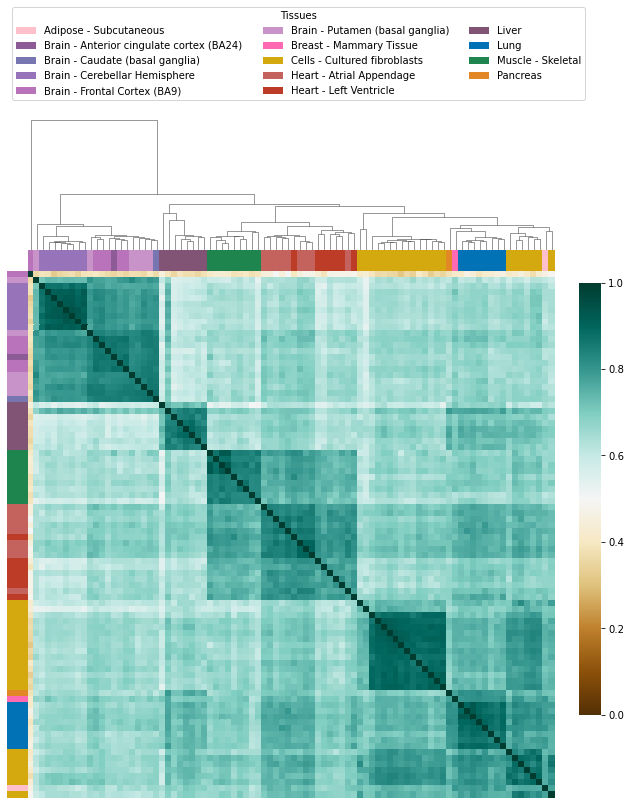

In [76]:
hierarchial_clustering_heatmap(novel_transcript_express_tissue_clean)

### Section 4: Hierarchial Clustering of Annotated Transcript Expression using Euclidean distance

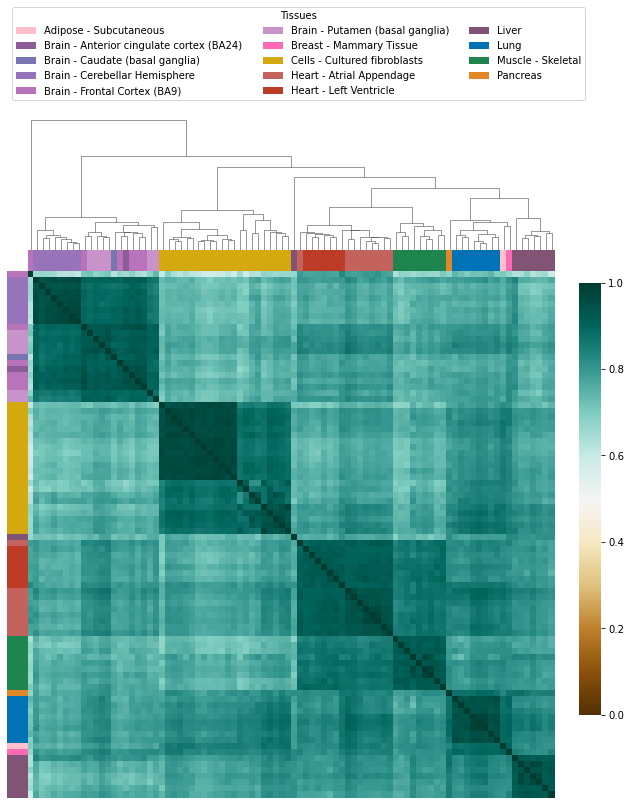

In [77]:
hierarchial_clustering_heatmap(annotated_transcript_express_tissue_clean)